# ****intro****

The National Health and Nutrition Examination Survey (NHANES) II, conducted from 1976 to 1980, stands as a pivotal and comprehensive health assessment program in the United States. Initiated by the National Center for Health Statistics (NCHS), a branch of the Centers for Disease Control and Prevention (CDC), NHANES II aimed to provide a thorough understanding of the health and nutritional status of the American population during that specific time frame.
Building on the foundation laid by its predecessor, NHANES I, which took place from 1971 to 1975, NHANES II continued its mandate of collecting extensive data through interviews, physical examinations, and laboratory tests. This survey played a crucial role in shaping public health policies and strategies by offering a detailed snapshot of the nation's health, nutrition, and disease prevalence.
NHANES II encompassed a wide range of health-related topics, including chronic diseases, nutritional habits, socioeconomic factors, and environmental exposures. By employing a stratified, multistage sampling approach, the survey ensured representation of various demographic groups, allowing for more accurate and generalizable findings.
The data collected during NHANES II has been instrumental in informing public health initiatives, guiding researchers, policymakers, and healthcare professionals in their efforts to address health disparities, assess the impact of interventions, and develop evidence-based strategies for improving the overall well-being of the U.S. population. As a foundational chapter in the NHANES series, NHANES II remains a valuable resource for understanding the evolving health landscape of the late 20th century in the United States


# **Objectives**


Identify the higher age  that have heartatk.

Identify the higher age  that have diabetes.

Identify sex   that have heartatk.

Identify the highest value of zinc

Identify the highest value of vitamin c.

Identify the most region 


# **questions**


### **1- Descriptive questions**

What is mean  of weight ,height, age?

What is mean  of  zinc, vitaminc, copper?

Distribution of region?

Who is more male or female?

Who has more highbp?

Are there any outliers in the dataset, and how do they affect the overall analysis? 

### **2- Exploratory questions**

Is Race correlated with finalwgt,leadwt?

Is region correlated with the hgp?

Is there a relationship weight between and diabetes?

What is the correlation between height and heartatk?

Is there a relationship hlthstat between and heartatk?

Is there a correlation between BMI and height, weight?

Is there a relationship BMI between and SEX?

Is there a correlation between RACE and hlthstat?


### **3-predictive question**

Can we predict price in general based on existing variable.

Can we predict the highest variable that affects diabetes.


# **Analysis**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sklearn as sk
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import statsmodels.formula.api as smf
from bokeh.plotting import figure, output_file, show
from bokeh.palettes import magma
from bokeh.models import ColumnDataSource
from plotnine import ggplot, aes, geom_point, theme_minimal, labs, theme, element_blank
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import statsmodels.stats.diagnostic as ssd
import  statsmodels.stats.outliers_influence as oi
import statsmodels.stats.anova as av
import statsmodels.stats.oneway as ow
from statsmodels.tsa.stattools import adfuller

**read data**

National Health and Nutrition Examination Survey -> nhanes

In [2]:
nhanes =pd.read_csv("clenning.ipynb (cnhanes).csv")

**selecte float data from nhanes**

In [3]:
n_nhanes = nhanes.select_dtypes(include=['float'])

In [4]:
n_nhanes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10349 entries, 0 to 10348
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   sampl     10349 non-null  float64
 1   strata    10349 non-null  float64
 2   location  10349 non-null  float64
 3   height    10349 non-null  float64
 4   weight    10349 non-null  float64
 5   tcresult  10349 non-null  float64
 6   hdresult  10349 non-null  float64
 7   hgb       10349 non-null  float64
 8   hct       10349 non-null  float64
 9   tibc      10349 non-null  float64
 10  iron      10349 non-null  float64
 11  finalwgt  10349 non-null  float64
 12  leadwt    10349 non-null  float64
 13  corpuscl  10349 non-null  float64
 14  trnsfern  10349 non-null  float64
 15  albumin   10349 non-null  float64
 16  vitaminc  10349 non-null  float64
 17  zinc      10349 non-null  float64
 18  copper    10349 non-null  float64
 19  porphyrn  10349 non-null  float64
 20  bmi       10349 non-null  fl

**clear outlier**

In [5]:
percentiles = n_nhanes.quantile([0.1, 0.9])

# Apply filtering for each column
for column in n_nhanes.columns:
    low = percentiles.loc[0.1]
    high = percentiles.loc[0.9]
    abdo = n_nhanes[(n_nhanes >= low) &(n_nhanes<=high)]

In [6]:
print(abdo.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10349 entries, 0 to 10348
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   sampl     8279 non-null   float64
 1   strata    8679 non-null   float64
 2   location  8341 non-null   float64
 3   height    8284 non-null   float64
 4   weight    8295 non-null   float64
 5   tcresult  8303 non-null   float64
 6   hdresult  8368 non-null   float64
 7   hgb       8414 non-null   float64
 8   hct       8371 non-null   float64
 9   tibc      8314 non-null   float64
 10  iron      8359 non-null   float64
 11  finalwgt  8282 non-null   float64
 12  leadwt    9314 non-null   float64
 13  corpuscl  8320 non-null   float64
 14  trnsfern  8307 non-null   float64
 15  albumin   8700 non-null   float64
 16  vitaminc  9146 non-null   float64
 17  zinc      8446 non-null   float64
 18  copper    8366 non-null   float64
 19  porphyrn  8360 non-null   float64
 20  bmi       8279 non-null   fl

**imput missing values**

In [7]:
imputer = IterativeImputer()
fit_imput = imputer.fit_transform(abdo)
cabdo = pd.DataFrame(fit_imput, columns = abdo.columns)

In [8]:
cabdo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10349 entries, 0 to 10348
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   sampl     10349 non-null  float64
 1   strata    10349 non-null  float64
 2   location  10349 non-null  float64
 3   height    10349 non-null  float64
 4   weight    10349 non-null  float64
 5   tcresult  10349 non-null  float64
 6   hdresult  10349 non-null  float64
 7   hgb       10349 non-null  float64
 8   hct       10349 non-null  float64
 9   tibc      10349 non-null  float64
 10  iron      10349 non-null  float64
 11  finalwgt  10349 non-null  float64
 12  leadwt    10349 non-null  float64
 13  corpuscl  10349 non-null  float64
 14  trnsfern  10349 non-null  float64
 15  albumin   10349 non-null  float64
 16  vitaminc  10349 non-null  float64
 17  zinc      10349 non-null  float64
 18  copper    10349 non-null  float64
 19  porphyrn  10349 non-null  float64
 20  bmi       10349 non-null  fl

 **concat data**

In [9]:
i_nhanes =nhanes.select_dtypes(include=['int'])
o_nhanes = nhanes.select_dtypes(include=['object'])

In [10]:
nhanes = pd.concat([cabdo,i_nhanes,o_nhanes],axis=1)

array([[<Axes: title={'center': 'sampl'}>,
        <Axes: title={'center': 'strata'}>,
        <Axes: title={'center': 'location'}>,
        <Axes: title={'center': 'height'}>,
        <Axes: title={'center': 'weight'}>,
        <Axes: title={'center': 'tcresult'}>],
       [<Axes: title={'center': 'hdresult'}>,
        <Axes: title={'center': 'hgb'}>, <Axes: title={'center': 'hct'}>,
        <Axes: title={'center': 'tibc'}>,
        <Axes: title={'center': 'iron'}>,
        <Axes: title={'center': 'finalwgt'}>],
       [<Axes: title={'center': 'leadwt'}>,
        <Axes: title={'center': 'corpuscl'}>,
        <Axes: title={'center': 'trnsfern'}>,
        <Axes: title={'center': 'albumin'}>,
        <Axes: title={'center': 'vitaminc'}>,
        <Axes: title={'center': 'zinc'}>],
       [<Axes: title={'center': 'copper'}>,
        <Axes: title={'center': 'porphyrn'}>,
        <Axes: title={'center': 'bmi'}>,
        <Axes: title={'center': 'houssiz'}>,
        <Axes: title={'center': 'ag

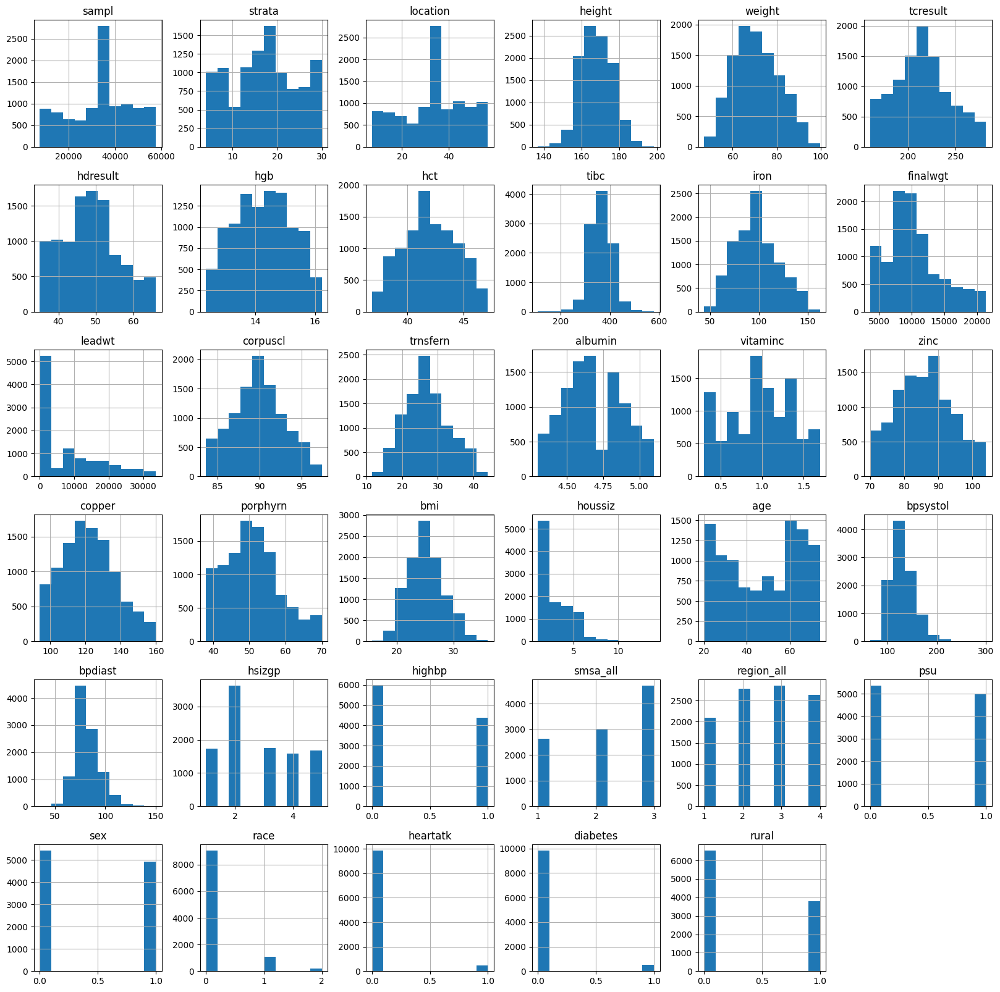

In [11]:
nhanes.hist(figsize=(20,20))


In [12]:
nhanes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10349 entries, 0 to 10348
Data columns (total 37 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   sampl       10349 non-null  float64
 1   strata      10349 non-null  float64
 2   location    10349 non-null  float64
 3   height      10349 non-null  float64
 4   weight      10349 non-null  float64
 5   tcresult    10349 non-null  float64
 6   hdresult    10349 non-null  float64
 7   hgb         10349 non-null  float64
 8   hct         10349 non-null  float64
 9   tibc        10349 non-null  float64
 10  iron        10349 non-null  float64
 11  finalwgt    10349 non-null  float64
 12  leadwt      10349 non-null  float64
 13  corpuscl    10349 non-null  float64
 14  trnsfern    10349 non-null  float64
 15  albumin     10349 non-null  float64
 16  vitaminc    10349 non-null  float64
 17  zinc        10349 non-null  float64
 18  copper      10349 non-null  float64
 19  porphyrn    10349 non-nul

In [13]:
nhanes.head()

,sampl,strata,location,height,weight,tcresult,hdresult,hgb,hct,tibc,...,smsa_all,region_all,psu,sex,race,heartatk,diabetes,rural,hlthstat,sizplace
0,33576.600295,15.942383,32.942435,174.598007,62.480000,226.000000,50.674981,13.900000,42.700001,377.0,...,2,3,0,1,0,0,0,0,Very good,"Urbanized area; 1,000,000–2,999,999"
1,33759.234650,16.451747,33.194070,166.820595,58.390811,179.000000,56.752631,13.756261,40.947136,363.0,...,2,3,0,0,0,0,0,0,Very good,"Urbanized area; 1,000,000–2,999,999"
2,33937.406792,16.611585,33.269093,164.098007,67.250000,218.679905,57.298683,13.500000,40.500000,353.0,...,1,3,0,0,2,0,0,0,Good,"Urbanized area; 1,000,000–2,999,999"
3,33732.309667,16.701131,33.170338,162.598007,67.465754,189.000000,41.660850,13.400000,38.700001,365.0,...,2,3,0,0,0,0,1,0,Fair,"Urbanized area; 1,000,000–2,999,999"
4,33695.912447,17.384561,33.063440,163.098007,74.279999,226.440007,48.591742,15.600000,45.500000,320.0,...,1,3,0,0,0,0,0,0,Very good,"Urbanized area; 1,000,000–2,999,999"


In [14]:
nhanes.describe()

,sampl,strata,location,height,weight,tcresult,hdresult,hgb,hct,tibc,...,hsizgp,highbp,smsa_all,region_all,psu,sex,race,heartatk,diabetes,rural
count,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,...,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000,10349.000000
mean,33745.987697,17.031454,33.183235,167.853916,70.861242,215.006209,48.628920,14.270329,42.014210,363.349423,...,2.790608,0.422843,2.200792,2.581119,0.481882,0.474925,0.143589,0.045995,0.048217,0.367378
std,13382.840533,7.422151,13.382768,8.334846,10.172868,28.664102,7.412772,0.927888,2.429586,45.413194,...,1.331985,0.494035,0.818039,1.075303,0.499696,0.499395,0.402042,0.209484,0.214235,0.482114
min,7465.000000,4.000000,7.000000,136.796996,46.930409,160.000000,35.000000,12.347565,36.845788,106.961345,...,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25490.000000,11.000000,25.000000,161.699005,63.160000,195.000000,43.632958,13.600000,40.000000,333.000000,...,2.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,33761.650423,17.000000,33.189348,167.500000,70.080002,214.000000,48.144409,14.296057,42.000000,361.000000,...,2.000000,0.000000,2.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,43563.000000,23.000000,43.000000,173.891380,78.360001,233.000000,53.000000,15.000000,44.000000,393.000000,...,4.000000,1.000000,3.000000,4.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000
max,57720.000000,30.000000,57.000000,198.415589,99.727269,282.000000,66.000000,16.232429,47.158331,580.102639,...,5.000000,1.000000,3.000000,4.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000


#### **descrptive analysis**

In [15]:
num_nhanes = nhanes.select_dtypes(include=['number'])

In [16]:
int_nhanes = nhanes.select_dtypes(include=['int'])

In [17]:
obj_nhanes = nhanes.select_dtypes(include=['object'])

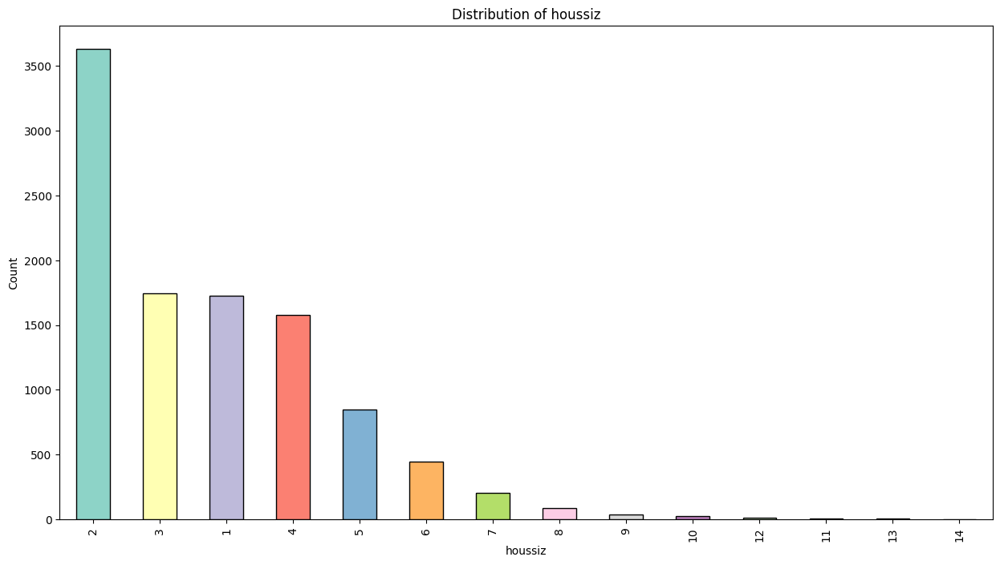

<Figure size 1500x800 with 0 Axes>

<Figure size 1500x800 with 0 Axes>

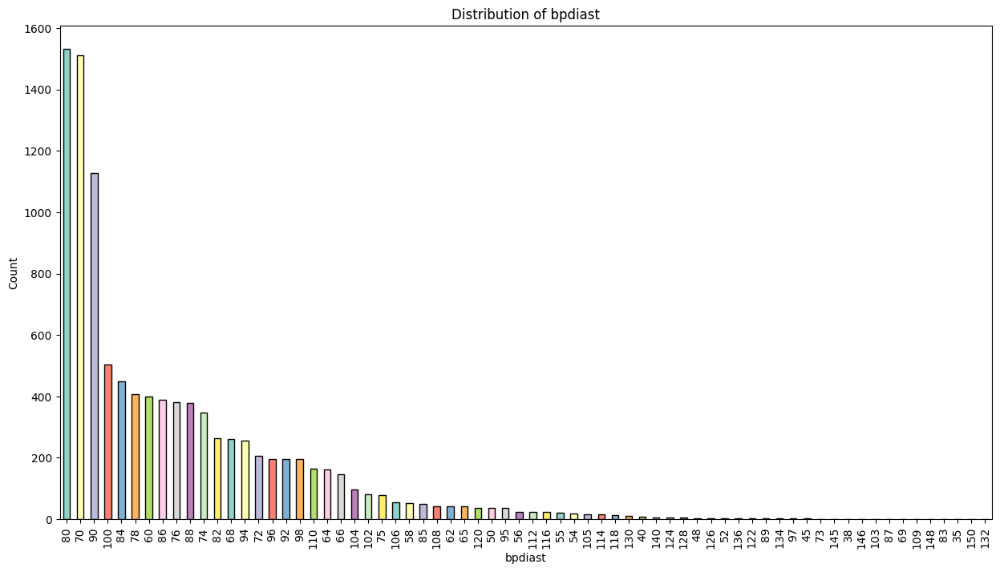

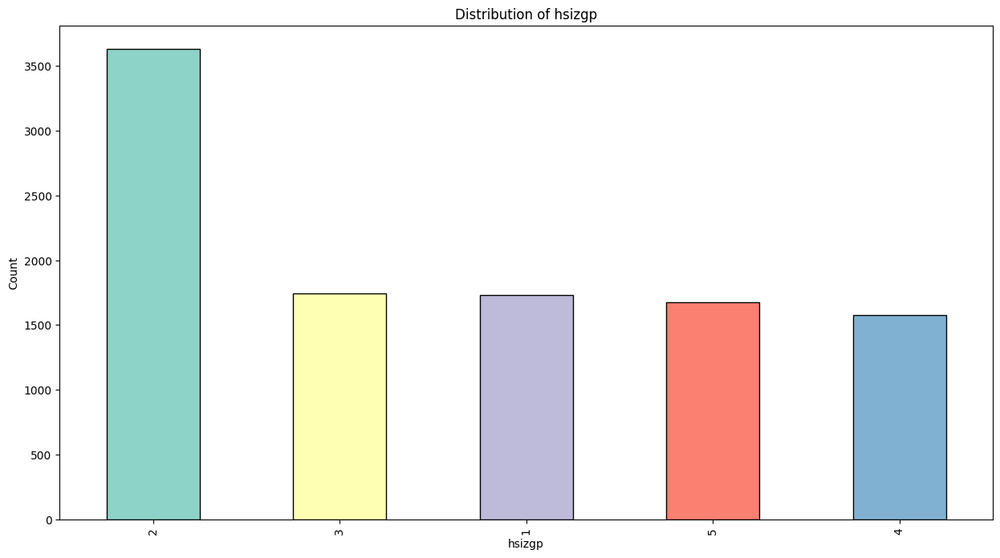

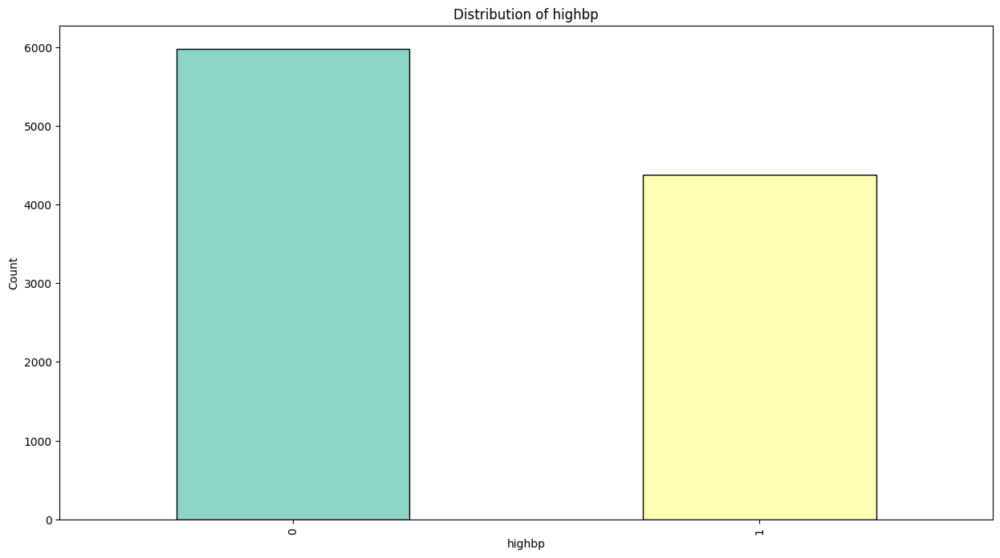

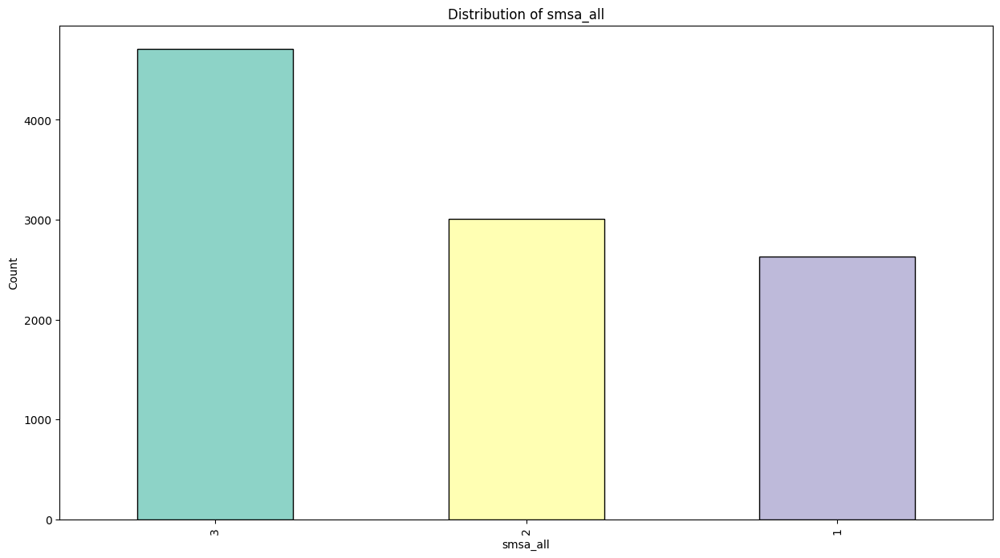

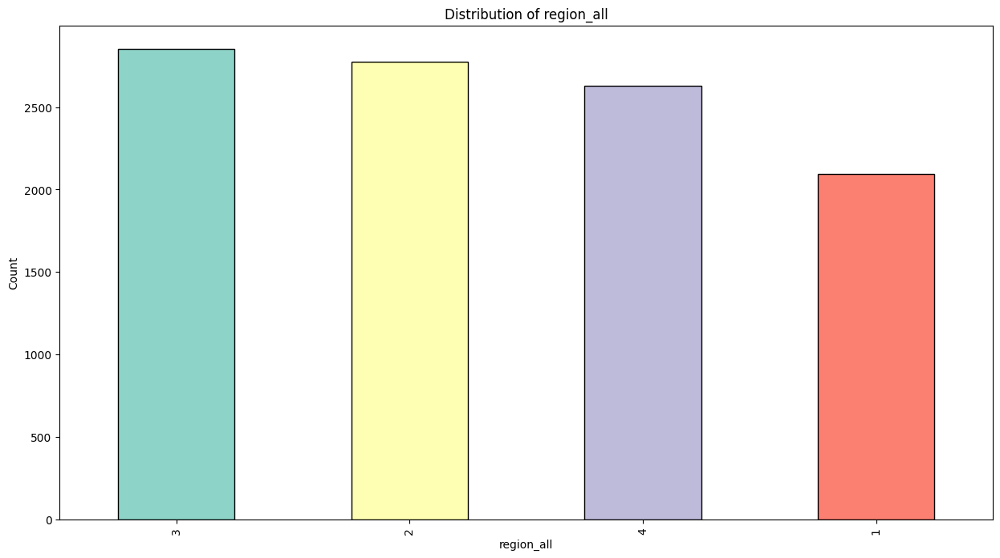

...

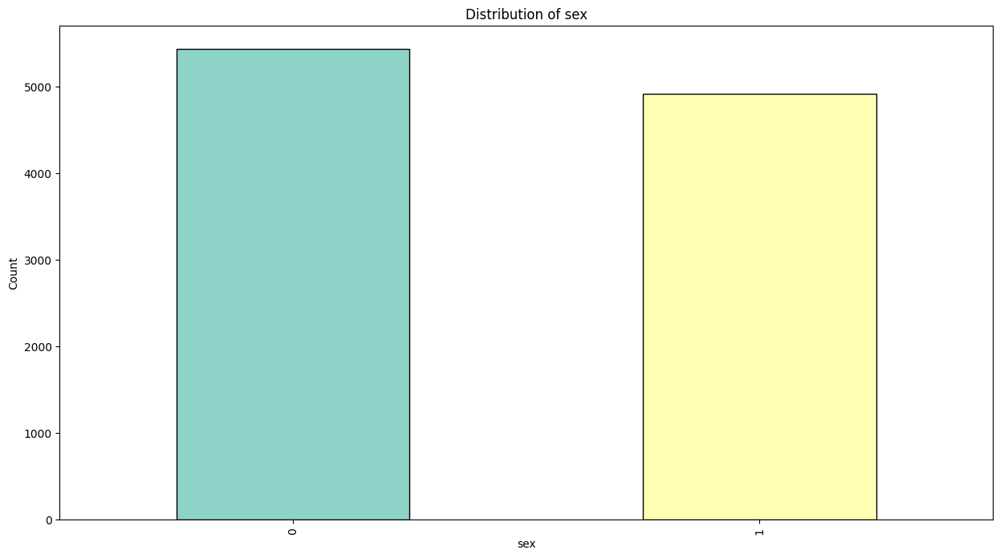

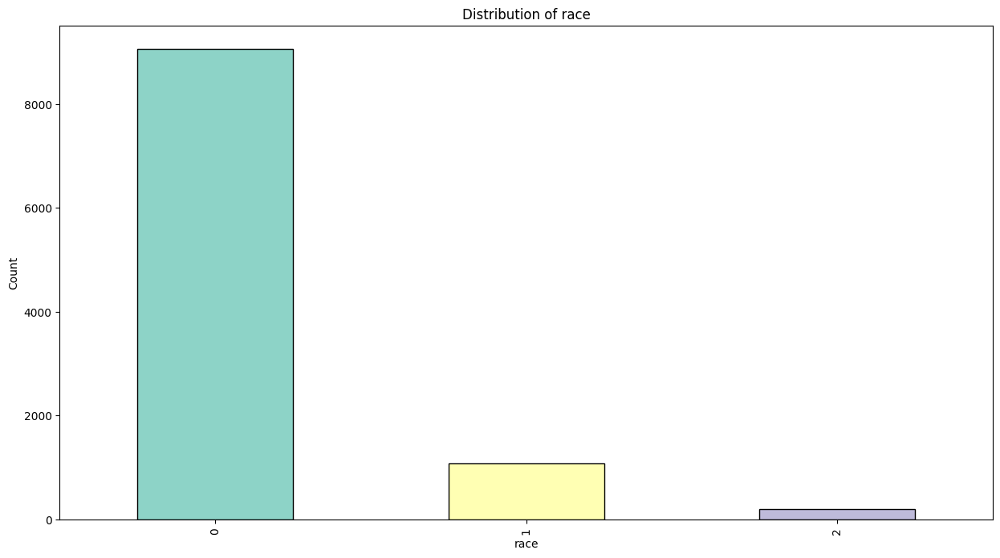

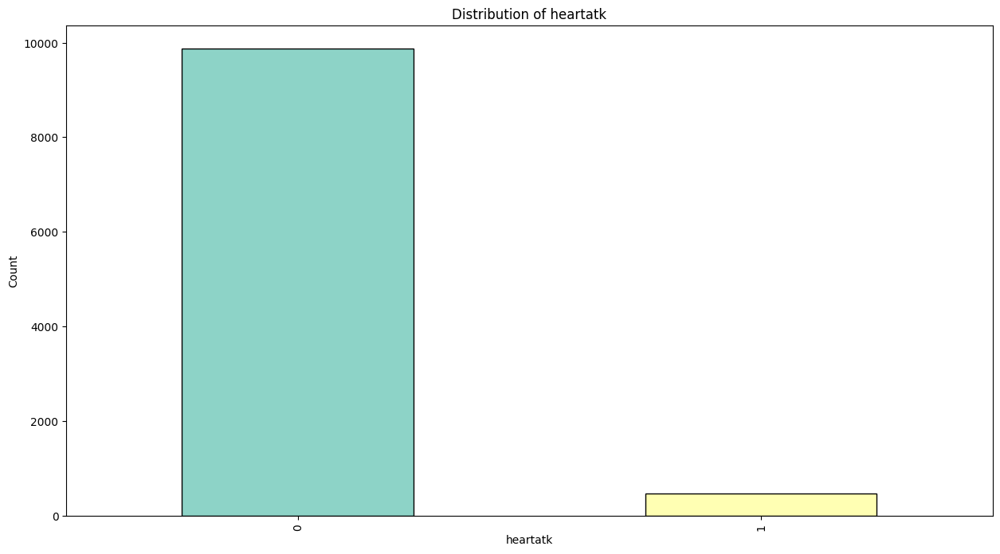

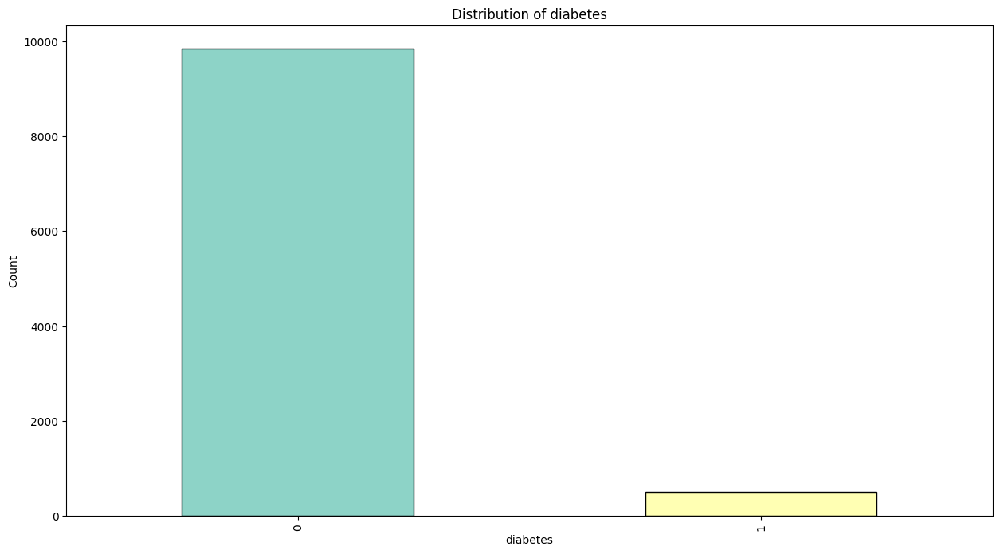

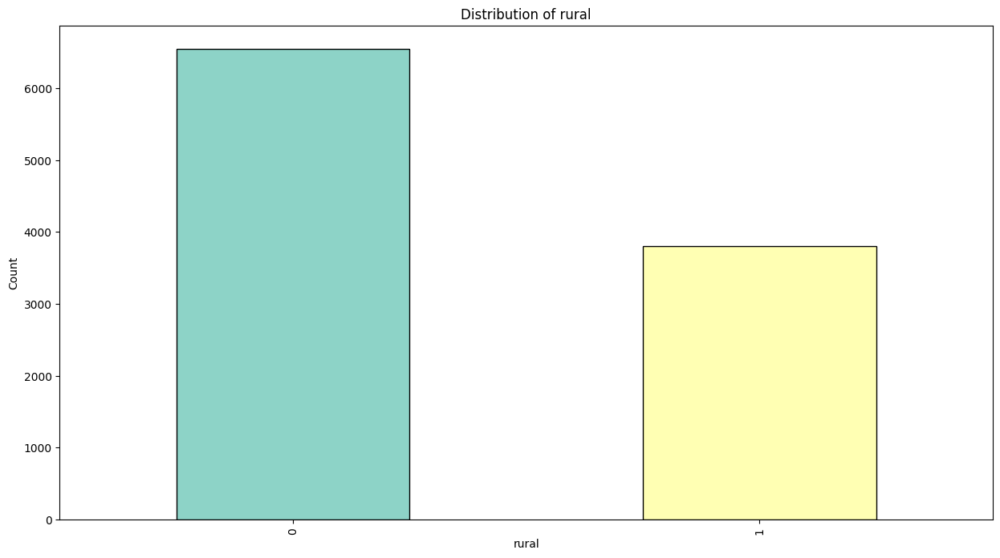

In [18]:
sns.set_palette("Set3")

# Assuming 'int_nhanes' is a list of column names and 'num_nhanes' is a DataFrame
for column in int_nhanes:
    plt.figure(figsize=(15, 8))
    
    # Skip certain columns
    if column in ['age', 'houssize', 'bpsystol']:
        continue

    # Plot the bar chart
    num_nhanes[column].value_counts().plot(kind='bar', color=sns.color_palette("Set3"), edgecolor='black')

    # Add labels and title
    plt.title(f'Distribution of {column}')
    plt.xlabel(f'{column}')
    plt.ylabel('Count')

    # Display the chart
    plt.show()


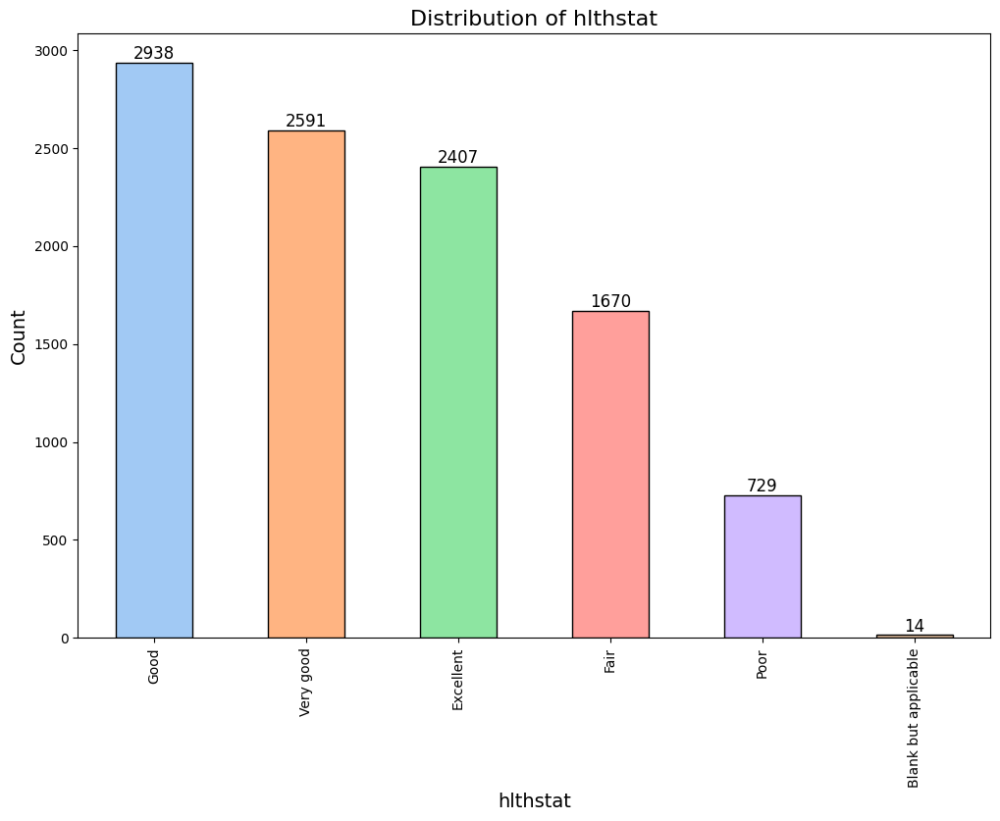

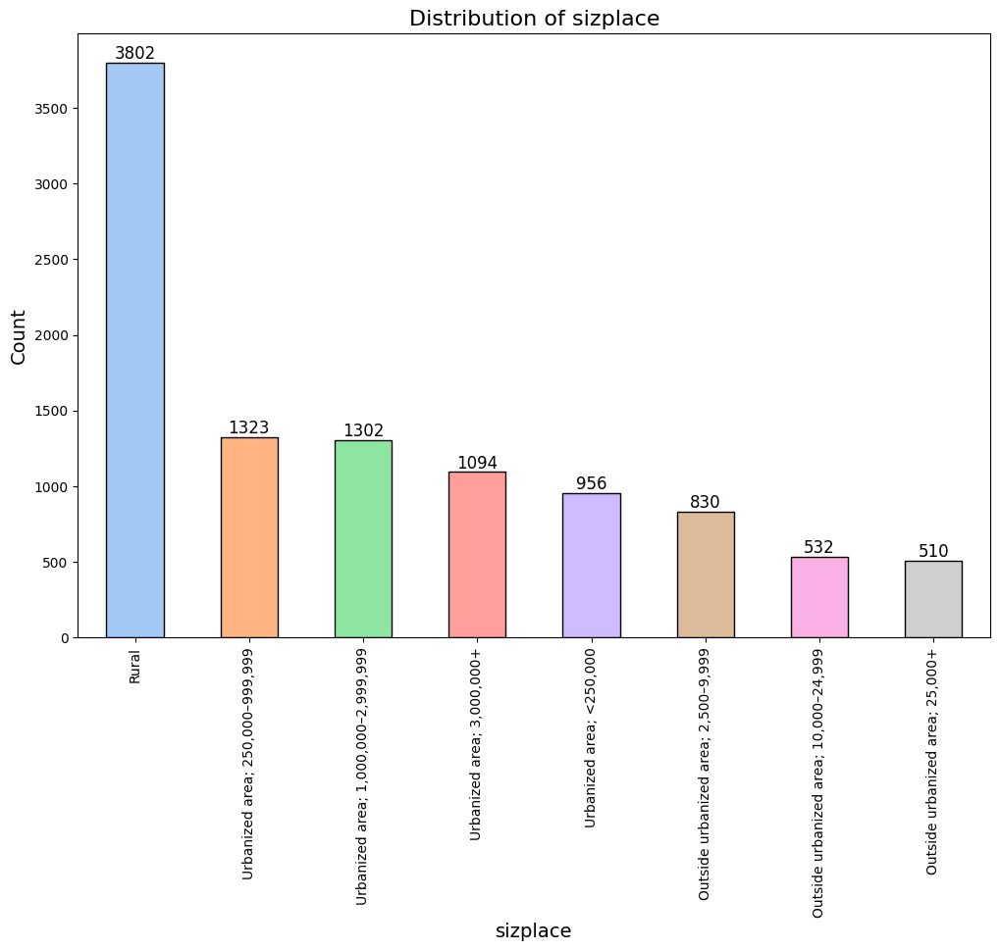

In [19]:
# Set a color palette for better visualization
sns.set_palette("pastel")

# Assuming 'obj_nhanes' is a DataFrame
for column in obj_nhanes:
    plt.figure(figsize=(12, 8))
    
    # Plot the bar chart
    obj_nhanes[column].value_counts().plot(kind='bar', color=sns.color_palette("pastel"), edgecolor='black')

    # Add labels and title
    plt.title(f'Distribution of {column}', fontsize=16)
    plt.xlabel(f'{column}', fontsize=14)
    plt.ylabel('Count', fontsize=14)

    # Add data labels on top of the bars
    for i, value in enumerate(obj_nhanes[column].value_counts()):
        plt.text(i, value + 0.1, str(value), ha='center', va='bottom', fontsize=12)

    # Display the chart
    plt.show()


#### **exploratory analysis**

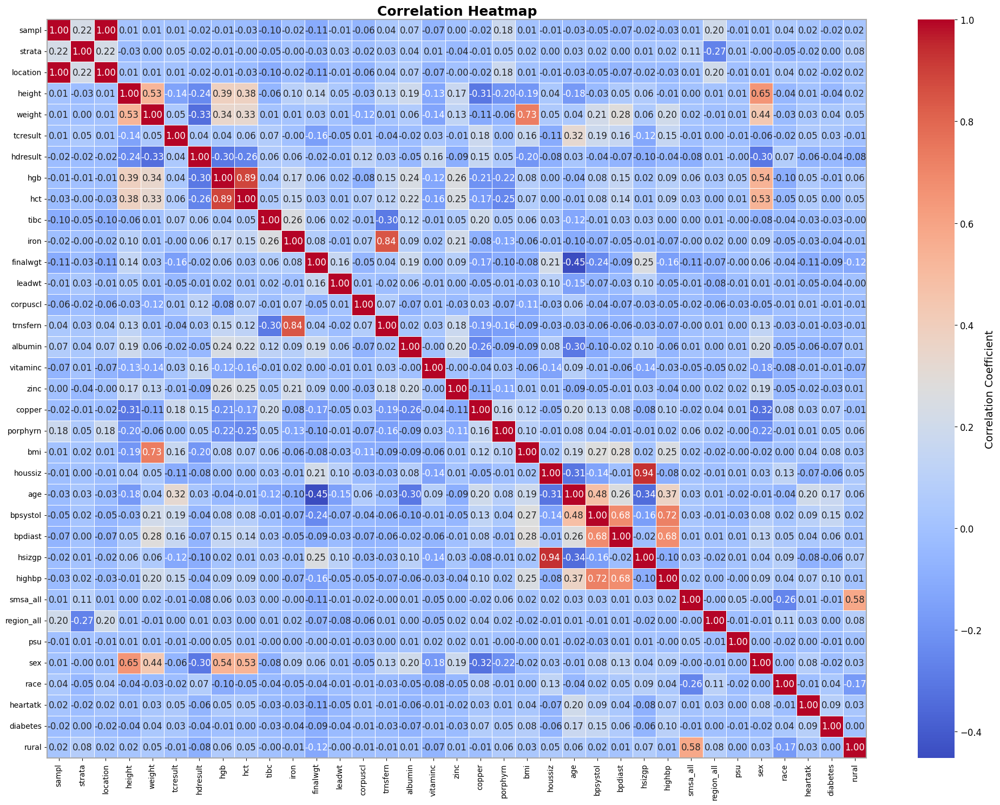

In [20]:


# Set a custom color palette
custom_palette = sns.color_palette("coolwarm", as_cmap=True)

# Set up the matplotlib figure
plt.figure(figsize=(20, 15))

# Create a heatmap with correlation values annotated
heatmap = sns.heatmap(
    num_nhanes.corr(),
    annot=True,
    cmap=custom_palette,
    fmt=".2f",
    linewidths=0.5,
    annot_kws={"size": 12},
)

# Customize the aesthetics
heatmap.set_title("Correlation Heatmap", fontsize=18, fontweight='bold')

# Rotate the y-axis ticks for better readability
plt.yticks(rotation=0)

# Add color bar with labeled values
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=12)
cbar.set_label('Correlation Coefficient', fontsize=14)

# Add a shadow to the annotation for better contrast
for _, spine in heatmap.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_edgecolor("darkgray")

# Adjust layout for better spacing
plt.tight_layout()

# Show the heatmap
plt.show()


we draw heatmap to see corrlation

 red color refrance to postive relationship

 blue color refrance to negtaive relationship

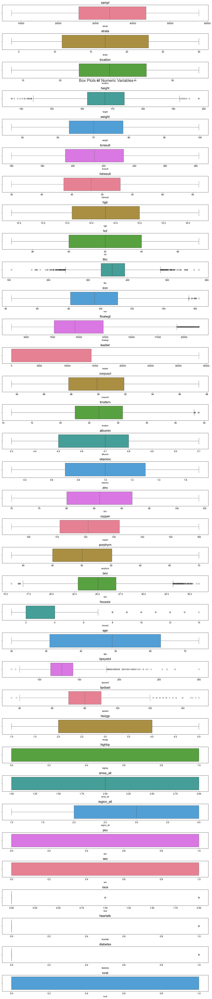

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming num_nhanes is your DataFrame
# Make sure to replace it with your actual DataFrame

# Your plotting code with additional styling
fig, axes = plt.subplots(nrows=len(num_nhanes.columns), figsize=(15, 70), sharex=False)

# Use a professional Seaborn style
sns.set(style="whitegrid")

# Define a color palette for the box plots
custom_palette = sns.color_palette("husl")

for i, column in enumerate(num_nhanes.columns):
    sns.boxplot(x=num_nhanes[column], ax=axes[i], color=custom_palette[i % len(custom_palette)])
    axes[i].set_title(column, fontsize=16)
    axes[i].tick_params(labelsize=12)

# Adjust layout for better spacing
plt.tight_layout()

plt.suptitle("Box Plots of Numeric Variables", y=0.92, fontsize=20)
plt.show()

draw scatter matriex show relation between each two variables

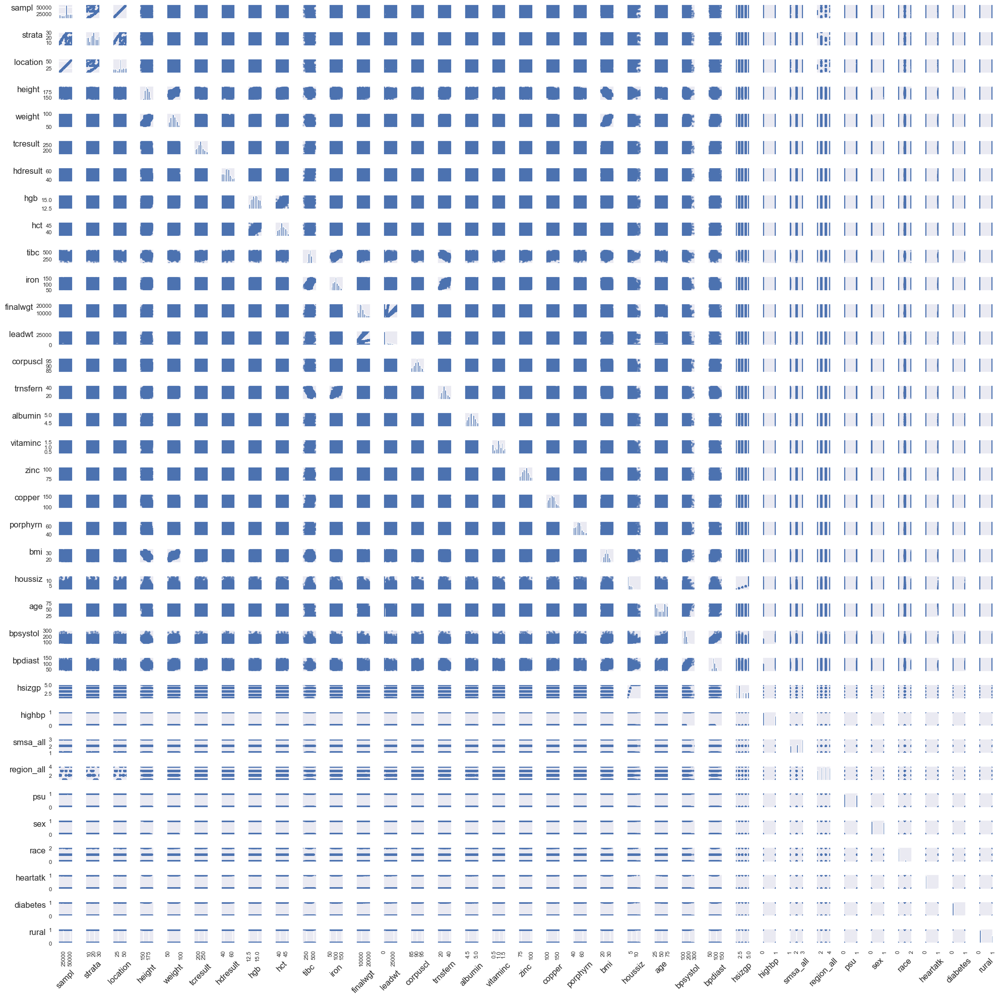

In [22]:
# Set Seaborn theme and color palette
sns.set_theme()
#sns.set_palette("husl")  # You can choose a different palette, for example, "coolwarm"
custom_palette = sns.color_palette("husl", n_colors=len(nhanes.columns))
# Create a scatter matrix
scatter_matrix = pd.plotting.scatter_matrix(nhanes, figsize=(20, 20), diagonal="hist", alpha=0.7)

# Customize scatter matrix with Seaborn style
for ax in scatter_matrix.flatten():
    ax.xaxis.label.set_rotation(45)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

draw scatter matriex show relation between each two variables

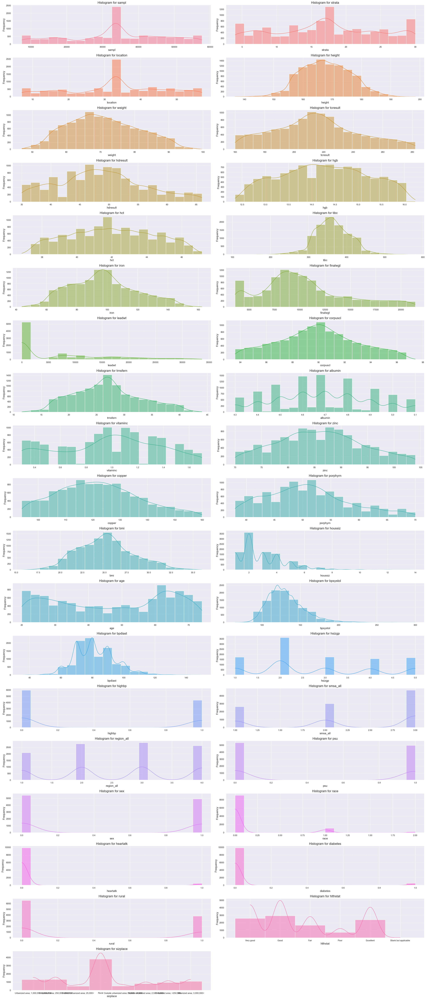

In [23]:
# Set a custom color palette
custom_palette = sns.color_palette("husl", n_colors=len(nhanes.columns))

# Set up subplots
fig, axes = plt.subplots(nrows=len(nhanes.columns) // 2 + 1, ncols=2, figsize=(30, 70), sharex=False)

# Flatten the axes array to iterate over them
axes = axes.flatten()

# Iterate through each column and create a histogram
for i, column in enumerate(nhanes.columns):
    sns.histplot(nhanes[column], bins=20, ax=axes[i], color=custom_palette[i], kde=True)
    axes[i].set_title(f'Histogram for {column}', fontsize=16)
    axes[i].set_xlabel(column, fontsize=14)
    axes[i].set_ylabel('Frequency', fontsize=14)
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)

# Remove empty subplots if there are an odd number of columns
if len(nhanes.columns) % 2 != 0:
    fig.delaxes(axes[-1])

# Adjust layout for better spacing
plt.tight_layout()

# Show the histograms
plt.show()


histogram for each variable to see distribution

**for all data the alpha =0.05**

## **bmi model**

In [24]:

bmi_model = smf.ols('bmi~height+weight',data=nhanes).fit()

In [25]:
print(bmi_model.summary())

                            OLS Regression Results                            
Dep. Variable:                    bmi   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                 1.990e+06
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:39:43   Log-Likelihood:                 4277.8
No. Observations:               10349   AIC:                            -8550.
Df Residuals:                   10346   BIC:                            -8528.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     50.4737      0.032   1556.250      0.0

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


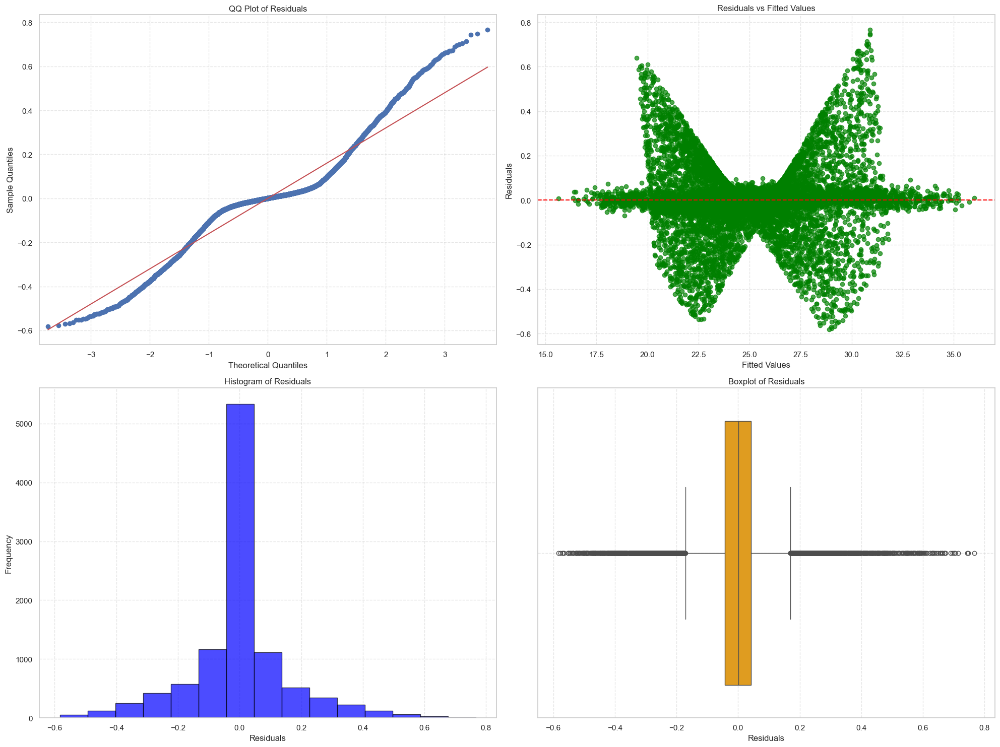

In [26]:
residuals = bmi_model.resid
fitted = bmi_model.fittedvalues
# Set seaborn style
sns.set(style="whitegrid")

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

# QQ Plot of Residuals
sm.qqplot(residuals, line='s', ax=axs[0, 0])
axs[0, 0].set_title('QQ Plot of Residuals')
axs[0, 0].grid(True, linestyle='--', alpha=0.5)

# Residuals vs Fitted Values
axs[0, 1].scatter(fitted, residuals, alpha=0.7, color='green')
axs[0, 1].axhline(y=0, color='red', linestyle='--')
axs[0, 1].set_xlabel('Fitted Values')
axs[0, 1].set_ylabel('Residuals')
axs[0, 1].set_title('Residuals vs Fitted Values')
axs[0, 1].grid(True, linestyle='--', alpha=0.5)

# Histogram of Residuals
axs[1, 0].hist(residuals, bins=15, edgecolor='black', color='blue', alpha=0.7)
axs[1, 0].set_title('Histogram of Residuals')
axs[1, 0].set_xlabel('Residuals')
axs[1, 0].set_ylabel('Frequency')
axs[1, 0].grid(True, linestyle='--', alpha=0.5)

# Boxplot of Residuals
sns.boxplot(x=residuals, ax=axs[1, 1], color='orange')
axs[1, 1].set_title('Boxplot of Residuals')
axs[1, 1].set_xlabel('Residuals')
axs[1, 1].grid(True, linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()


**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [27]:
influence = oi.OLSInfluence(bmi_model).summary_frame()
influence

,dfb_Intercept,dfb_height,dfb_weight,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,-0.024296,0.033923,-0.034113,6.847282e-04,2.360127,0.000369,0.045323,2.360649,0.045333
1,-0.000121,0.000652,-0.001452,1.086317e-06,0.108228,0.000278,0.001805,0.108223,0.001805
2,-0.000189,0.000127,0.000057,6.839869e-08,-0.041679,0.000118,-0.000453,-0.041677,-0.000453
3,0.000429,-0.000345,-0.000001,1.941115e-07,0.065660,0.000135,0.000763,0.065657,0.000763
4,0.006464,-0.007465,0.006355,4.532443e-05,0.863756,0.000182,0.011661,0.863745,0.011661
...,...,...,...,...,...,...,...,...,...
10344,0.000351,-0.002241,0.005194,1.275918e-05,-0.336831,0.000337,-0.006187,-0.336816,-0.006187
10345,0.001795,-0.001493,0.000041,2.282837e-06,0.199584,0.000172,0.002617,0.199575,0.002617
10346,0.001764,-0.001864,0.001314,4.170701e-06,0.303203,0.000136,0.003537,0.303190,0.003537
10347,-0.000238,0.000795,-0.001601,1.082621e-06,0.084047,0.000460,0.001802,0.084043,0.001802


**we chcek outliers**

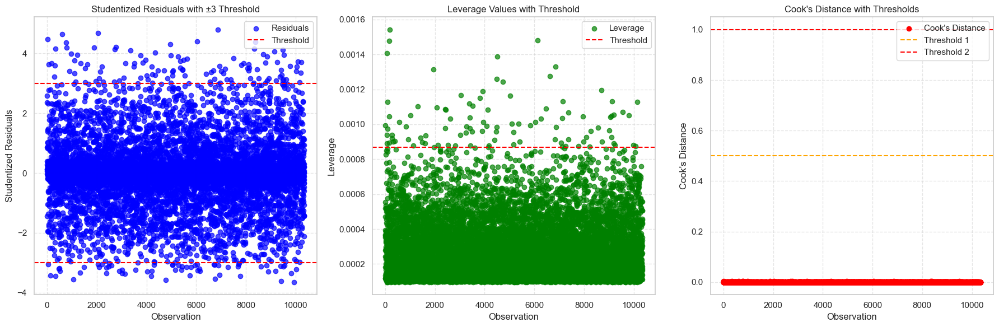

In [28]:
# Assuming 'bmi_model' is your regression model and 'influence' is the influence object

k = len(bmi_model.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence["student_resid"], color='blue', alpha=0.7, label='Residuals')
axs[0].axhline(y=3, color='red', linestyle='--', label='Threshold')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')
axs[0].legend(loc='upper right')
axs[0].grid(True, linestyle='--', alpha=0.5)

# Leverage Plot
axs[1].scatter(range(n), influence["hat_diag"], color='green', alpha=0.7, label='Leverage')
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--', label='Threshold')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')
axs[1].legend(loc='upper right')
axs[1].grid(True, linestyle='--', alpha=0.5)

# Cook's Distance Plot
axs[2].scatter(range(n), influence["cooks_d"], marker='o', color='red', label="Cook's Distance")
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--', label='Threshold 1')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--', label='Threshold 2')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")
axs[2].legend(loc='upper right')
axs[2].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [29]:

bmi_hetro = ssd.het_breuschpagan(bmi_model.resid,bmi_model.model.exog)
bmi_hetro_test_statistic, bmi_hetro_p_value = bmi_hetro[:2]
bmi_hetro_test_statistic, bmi_hetro_p_value


(np.float64(21.08146087904968), np.float64(2.643741174206812e-05))

### **transformation**

**transformation for y(dependant variable) and x(independant variable) beecase the four assumptions (normality, leniarty, equal variance, dependency)** 

In [30]:
bmi_model_t = smf.ols('np.log(bmi)~np.log(height)+np.log(weight)',data=nhanes).fit()
bmi_model_t.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            np.log(bmi)   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                 9.375e+05
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:40:14   Log-Likelihood:                 33777.
No. Observations:               10349   AIC:                        -6.755e+04
Df Residuals:                   10346   BIC:                        -6.753e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          9.1985      0.010    944.891      0.000       9.179       9.218
np.log(height)    -1.9949      0.002   -928.220      0.000      -1.999      -1.991
np.log(weight)     0.9965      0.001   1343.721      0.000       0.995       0.998
==============================================================================
Omnibus:                     2391.889   Durbin-Watson:                   2.020
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            23731.596
Skew:                          -0.824   Prob(JB):                         0.00
Kurtosis:                      10.233   Cond. No.                         737.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


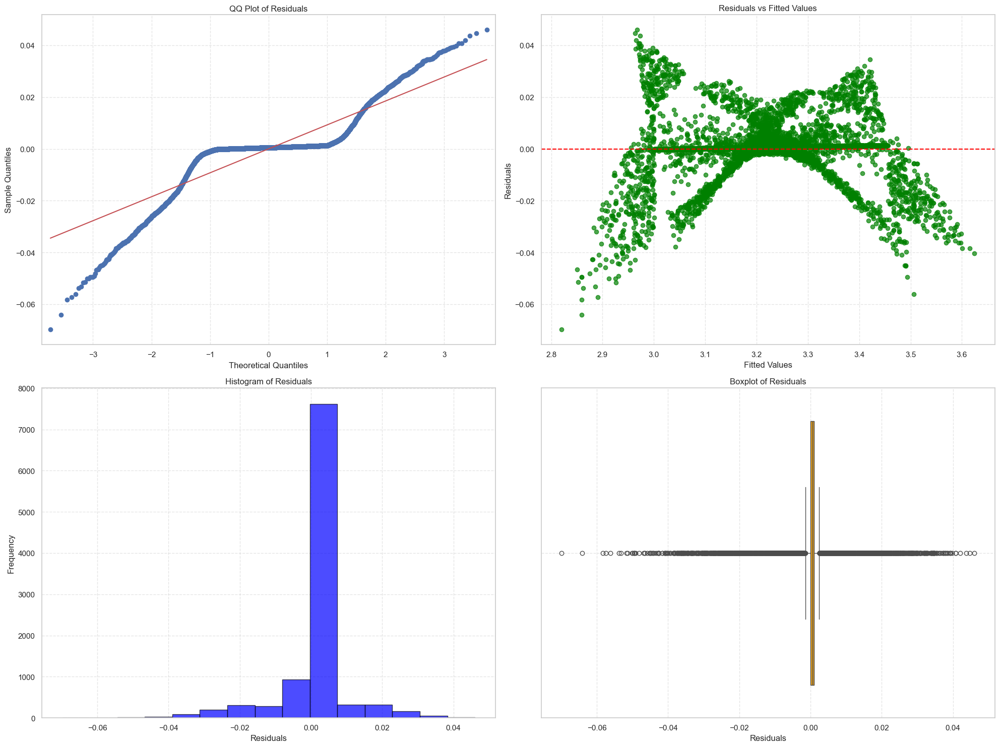

In [31]:

residuals = bmi_model_t.resid
fitted = bmi_model_t.fittedvalues
# Set seaborn style
sns.set(style="whitegrid")

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

# QQ Plot of Residuals
sm.qqplot(residuals, line='s', ax=axs[0, 0])
axs[0, 0].set_title('QQ Plot of Residuals')
axs[0, 0].grid(True, linestyle='--', alpha=0.5)

# Residuals vs Fitted Values
axs[0, 1].scatter(fitted, residuals, alpha=0.7, color='green')
axs[0, 1].axhline(y=0, color='red', linestyle='--')
axs[0, 1].set_xlabel('Fitted Values')
axs[0, 1].set_ylabel('Residuals')
axs[0, 1].set_title('Residuals vs Fitted Values')
axs[0, 1].grid(True, linestyle='--', alpha=0.5)

# Histogram of Residuals
axs[1, 0].hist(residuals, bins=15, edgecolor='black', color='blue', alpha=0.7)
axs[1, 0].set_title('Histogram of Residuals')
axs[1, 0].set_xlabel('Residuals')
axs[1, 0].set_ylabel('Frequency')
axs[1, 0].grid(True, linestyle='--', alpha=0.5)

# Boxplot of Residuals
sns.boxplot(x=residuals, ax=axs[1, 1], color='orange')
axs[1, 1].set_title('Boxplot of Residuals')
axs[1, 1].set_xlabel('Residuals')
axs[1, 1].grid(True, linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()


**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [32]:
influence_1 = oi.OLSInfluence(bmi_model_t).summary_frame()
influence_1

,dfb_Intercept,dfb_np.log(height),dfb_np.log(weight),cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,0.000076,-0.000095,0.000095,5.385526e-09,-0.006672,0.000363,-0.000127,-0.006671,-0.000127
1,-0.000552,0.001315,-0.002831,3.986592e-06,0.201017,0.000296,0.003458,0.201007,0.003458
2,0.000218,-0.000176,-0.000042,1.159711e-07,0.054970,0.000115,0.000590,0.054968,0.000590
3,0.000410,-0.000369,0.000041,2.026473e-07,0.067454,0.000134,0.000780,0.067451,0.000780
4,0.000714,-0.000841,0.000760,5.766591e-07,0.095556,0.000189,0.001315,0.095551,0.001315
...,...,...,...,...,...,...,...,...,...
10344,0.000055,-0.000140,0.000313,4.426029e-08,-0.018821,0.000375,-0.000364,-0.018820,-0.000364
10345,0.001270,-0.001146,0.000120,1.244329e-06,0.147494,0.000172,0.001932,0.147487,0.001932
10346,-0.000052,0.000058,-0.000046,3.983219e-09,-0.009219,0.000141,-0.000109,-0.009218,-0.000109
10347,-0.000308,0.000638,-0.001258,6.429673e-07,0.059721,0.000541,0.001389,0.059718,0.001389


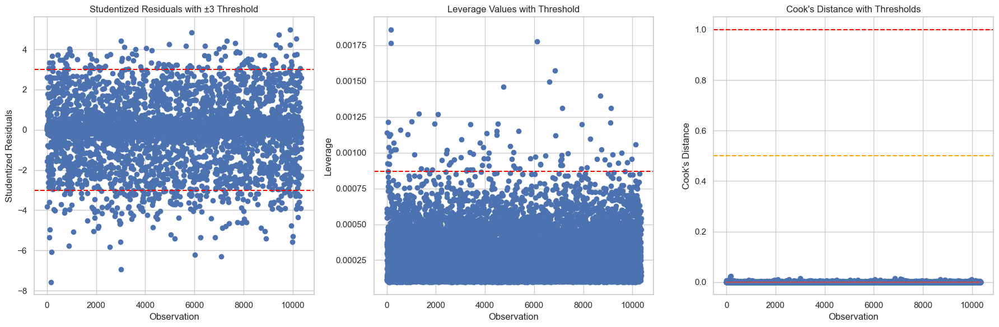

In [33]:
k = len(bmi_model_t.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_1["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_1["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_1["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [34]:
bmi_hetro_t = ssd.het_breuschpagan(bmi_model_t.resid,bmi_model_t.model.exog)

In [35]:
bmi_hetro_t_test_statistic, bmi_hetro_p_value = bmi_hetro_t[:2]
bmi_hetro_t_test_statistic, bmi_hetro_p_value

(np.float64(127.6311665326845), np.float64(1.928609616789e-28))

## **Weight least squaren bmi model**

In [36]:
waight =1/(bmi_model.resid**2)


In [37]:
bmi_model_weight = smf.wls('bmi~height+weight',data=nhanes,weights=waight).fit()

In [38]:
bmi_model_weight.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:                    bmi   R-squared:                       1.000
Model:                            WLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 5.554e+10
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:40:44   Log-Likelihood:                 17984.
No. Observations:               10349   AIC:                        -3.596e+04
Df Residuals:                   10346   BIC:                        -3.594e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     50.4736      0.000   3.75e+05      0.000      50.473      50.474
height        -0.3013   1.02e-06  -2.95e+05      0.000      -0.301      -0.301
weight         0.3561   1.21e-06   2.94e+05      0.000       0.356       0.356
==============================================================================
Omnibus:                    35613.664   Durbin-Watson:                   2.010
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1724.532
Skew:                          -0.032   Prob(JB):                         0.00
Kurtosis:                       1.001   Cond. No.                     3.52e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.52e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


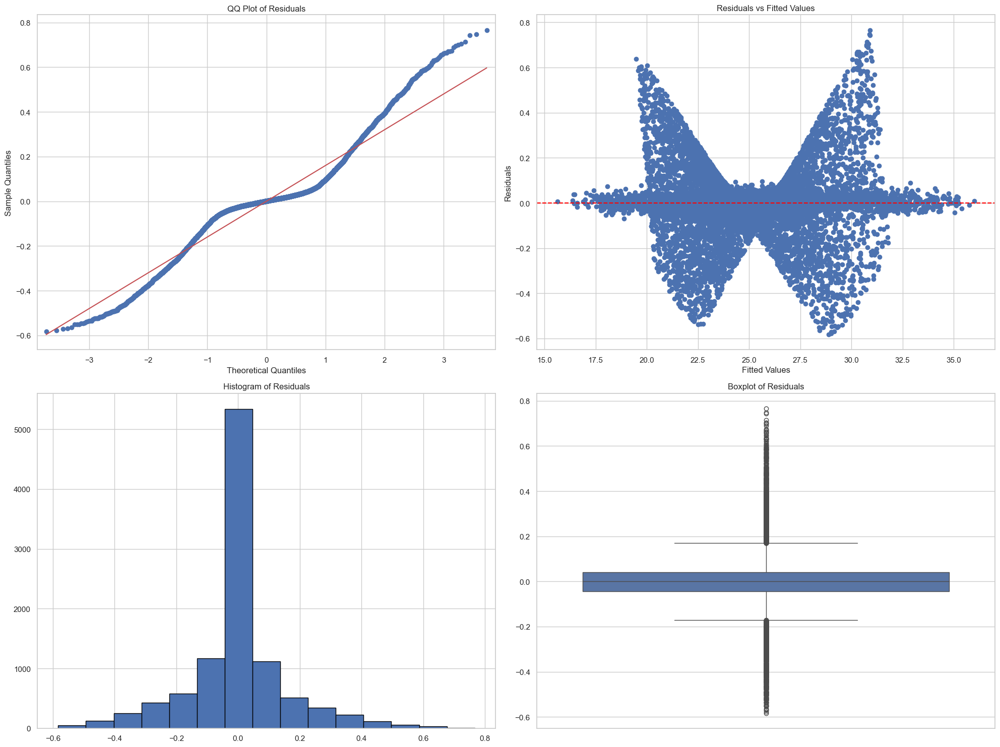

In [39]:
residuals = bmi_model_weight.resid
fitted = bmi_model_weight.fittedvalues

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sm.qqplot(residuals, line='s', ax=axs[0,0])
axs[0,0].set_title('QQ Plot of Residuals')

axs[0,1].scatter(fitted, residuals)
axs[0,1].axhline(y=0, color='red', linestyle='--')
axs[0,1].set_xlabel('Fitted Values')
axs[0,1].set_ylabel('Residuals')
axs[0,1].set_title('Residuals vs Fitted Values')

axs[1,0].hist(residuals, bins=15, edgecolor='black')
axs[1,0].set_title('Histogram of Residuals')

sns.boxplot(residuals, ax= axs[1,1])
axs[1,1].set_title('Boxplot of Residuals')

plt.tight_layout()
plt.show()

**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [40]:
influence_2 = oi.OLSInfluence(bmi_model_weight).summary_frame()
influence_2

,dfb_Intercept,dfb_height,dfb_weight,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,-40.784078,51.389505,-35.840248,4.670002e-11,0.377658,9.822923e-10,1.183639e-05,2.360122,0.000074
1,-4.348674,6.166193,-5.185599,1.431844e-12,0.017309,1.433798e-08,2.072567e-06,0.108139,0.000013
2,-4.451085,5.452529,-3.769255,1.443560e-13,-0.006672,9.727044e-09,-6.580791e-07,-0.041688,-0.000004
3,-3.520865,4.810354,-3.823899,1.940304e-13,0.010508,5.272006e-09,7.629490e-07,0.065649,0.000005
4,5.574360,-4.866351,2.141967,6.272927e-12,0.138237,9.847880e-10,4.338062e-06,0.863692,0.000027
...,...,...,...,...,...,...,...,...,...
10344,-3.638344,2.233110,1.051895,5.462376e-12,-0.053913,5.637814e-09,-4.048102e-06,-0.336835,-0.000025
10345,-1.461660,3.249955,-3.784475,4.914108e-13,0.031941,1.444971e-09,1.214180e-06,0.199560,0.000008
10346,-1.508898,2.746574,-2.588856,1.584662e-12,0.048527,2.018824e-09,2.180364e-06,0.303180,0.000014
10347,-4.525293,6.360858,-5.324703,1.951969e-12,0.013434,3.244738e-08,2.419898e-06,0.083932,0.000015


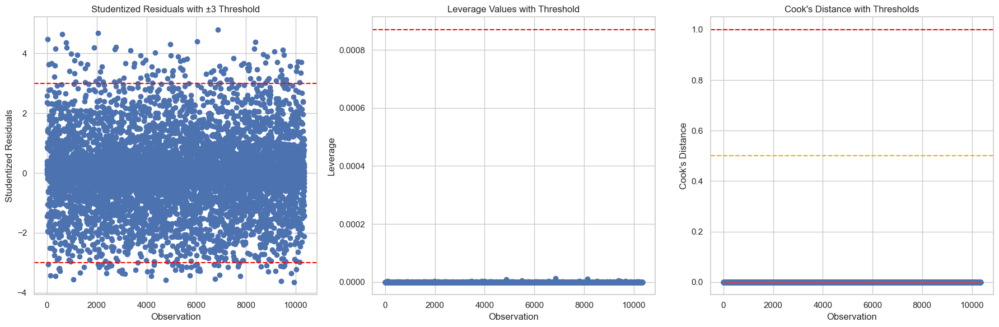

In [41]:
k = len(bmi_model_weight.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_2["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_2["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_2["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [42]:
bmi_hetro_weight = ssd.het_breuschpagan(bmi_model_weight.resid,bmi_model_weight.model.exog)
bmi_hetro_weight_test_statistic, bmi_hetro_weight_p_value = bmi_hetro_weight[:2]
bmi_hetro_weight_test_statistic, bmi_hetro_weight_p_value

(np.float64(21.098032765394652), np.float64(2.6219257904043005e-05))

### **transformation**

**transformation for y(dependant variable) and x(independant variable) beecase the four assumptions (normality, leniarty, equal variance, dependency)** 

In [43]:
bmi_model_weight_t = smf.wls('np.log(bmi)~np.log(height)+np.log(weight)',data=nhanes,weights=waight).fit()

In [44]:
bmi_model_weight_t.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:            np.log(bmi)   R-squared:                       0.999
Model:                            WLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 3.713e+06
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:41:13   Log-Likelihood:                 1258.1
No. Observations:               10349   AIC:                            -2510.
Df Residuals:                   10346   BIC:                            -2489.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          8.9205      0.003   2560.750      0.000       8.914       8.927
np.log(height)    -1.9230      0.001  -2384.090      0.000      -1.925      -1.921
np.log(weight)     0.9756      0.000   2392.355      0.000       0.975       0.976
==============================================================================
Omnibus:                    18627.320   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        125936873.944
Skew:                         -12.367   Prob(JB):                         0.00
Kurtosis:                     542.856   Cond. No.                         716.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


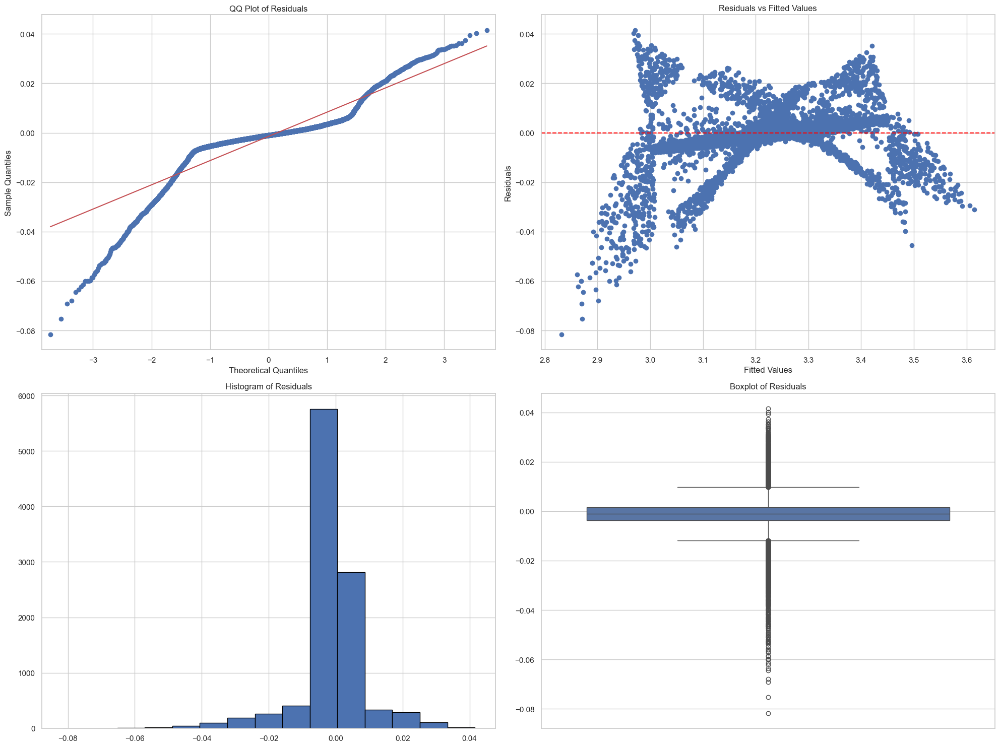

In [45]:
residuals = bmi_model_weight_t.resid
fitted = bmi_model_weight_t.fittedvalues

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sm.qqplot(residuals, line='s', ax=axs[0,0])
axs[0,0].set_title('QQ Plot of Residuals')

axs[0,1].scatter(fitted, residuals)
axs[0,1].axhline(y=0, color='red', linestyle='--')
axs[0,1].set_xlabel('Fitted Values')
axs[0,1].set_ylabel('Residuals')
axs[0,1].set_title('Residuals vs Fitted Values')

axs[1,0].hist(residuals, bins=15, edgecolor='black')
axs[1,0].set_title('Histogram of Residuals')

sns.boxplot(residuals, ax= axs[1,1])
axs[1,1].set_title('Boxplot of Residuals')

plt.tight_layout()
plt.show()

**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [46]:
influence_3 = oi.OLSInfluence(bmi_model_weight_t).summary_frame()
influence_3

,dfb_Intercept,dfb_np.log(height),dfb_np.log(weight),cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,-43411.702071,48523.606913,-27946.059452,5.539885e-16,-0.001364,8.927980e-10,-4.076721e-08,-0.742166,-0.000022
1,-43412.742436,48525.746298,-27949.008469,1.803694e-15,-0.000613,1.439523e-08,-7.356005e-08,-0.333503,-0.000040
2,-43411.493265,48523.496519,-27946.198622,1.134048e-17,-0.000059,9.925649e-09,-5.832791e-09,-0.031847,-0.000003
3,-43411.203988,48523.220431,-27946.118428,2.168978e-17,0.000109,5.480427e-09,8.066556e-09,0.059272,0.000004
4,-43410.752577,48522.547580,-27945.413970,8.910845e-17,0.000517,9.995888e-10,1.635009e-08,0.281304,0.000009
...,...,...,...,...,...,...,...,...,...
10344,-43411.734792,48523.542803,-27945.844291,2.503094e-15,-0.001128,5.899442e-09,-8.665611e-08,-0.613706,-0.000047
10345,-43409.932781,48522.135115,-27946.063639,6.785366e-17,0.000370,1.485506e-09,1.426748e-08,0.201362,0.000008
10346,-43411.897256,48523.829693,-27946.198872,1.150995e-17,0.000128,2.121744e-09,5.876210e-09,0.069393,0.000003
10347,-43412.294694,48524.678093,-27947.402796,1.873041e-14,-0.001258,3.549570e-08,-2.370469e-07,-0.684405,-0.000129


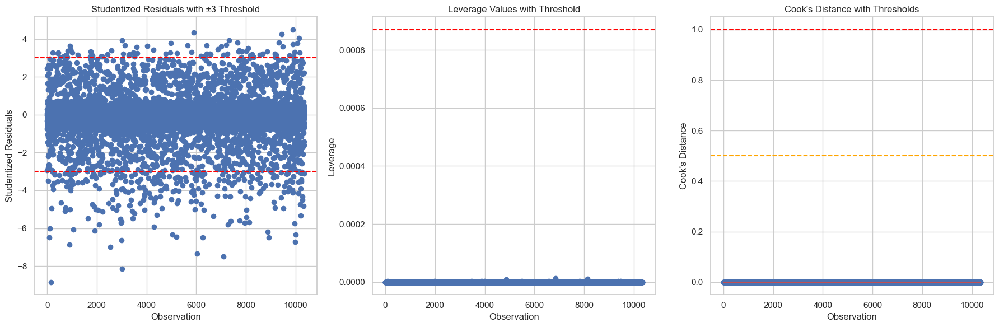

In [47]:
k = len(bmi_model_weight_t.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_3["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_3["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_3["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [48]:
bmi_hetro_weight_t = ssd.het_breuschpagan(bmi_model_weight_t.resid,bmi_model_weight_t.model.exog)
bmi_hetro_weight_t_test_statistic, bmi_hetro_weight_t_p_value = bmi_hetro_weight_t[:2]
bmi_hetro_weight_t_test_statistic, bmi_hetro_weight_t_p_value

(np.float64(712.567581767337), np.float64(1.8531715644360927e-155))

## **logestic highbp model**

**The logestic moodel for categorical variables** 

highbp -> high blood pressure


In [49]:
#heart_model = smf.ols('(highbp)~bpdiast+bpsystol',data=nhanes).fit()
highbp_model = smf.logit('(highbp)~bpdiast+bpsystol',data=nhanes).fit()

Optimization terminated successfully.
         Current function value: 0.165689
         Iterations 10


In [50]:
print(highbp_model.summary())

                           Logit Regression Results                           
Dep. Variable:                 highbp   No. Observations:                10349
Model:                          Logit   Df Residuals:                    10346
Method:                           MLE   Df Model:                            2
Date:                Mon, 10 Mar 2025   Pseudo R-squ.:                  0.7568
Time:                        10:41:42   Log-Likelihood:                -1714.7
converged:                       True   LL-Null:                       -7049.7
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -49.6261      1.249    -39.741      0.000     -52.074     -47.179
bpdiast        0.2504      0.008     32.661      0.000       0.235       0.265
bpsystol       0.2176      0.006     36.483      0.0

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


## **bpsystol_model**

In [51]:
bpsystol_model = smf.ols('(bpsystol)~age+vitaminc+zinc',data=nhanes).fit()

In [52]:
bpsystol_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               bpsystol   R-squared:                       0.235
Model:                            OLS   Adj. R-squared:                  0.235
Method:                 Least Squares   F-statistic:                     1059.
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:41:42   Log-Likelihood:                -45896.
No. Observations:               10349   AIC:                         9.180e+04
Df Residuals:                   10345   BIC:                         9.183e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    105.1161      2.309     45.517      0.000     100.589     109.643
age            0.6581      0.012     55.990      0.000       0.635       0.681
vitaminc      -3.5798      0.527     -6.792      0.000      -4.613      -2.547
zinc          -0.0233      0.025     -0.939      0.348      -0.072       0.025
==============================================================================
Omnibus:                     1507.947   Durbin-Watson:                   1.881
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3290.606
Skew:                           0.868   Prob(JB):                         0.00
Kurtosis:                       5.148   Cond. No.                     1.14e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.14e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


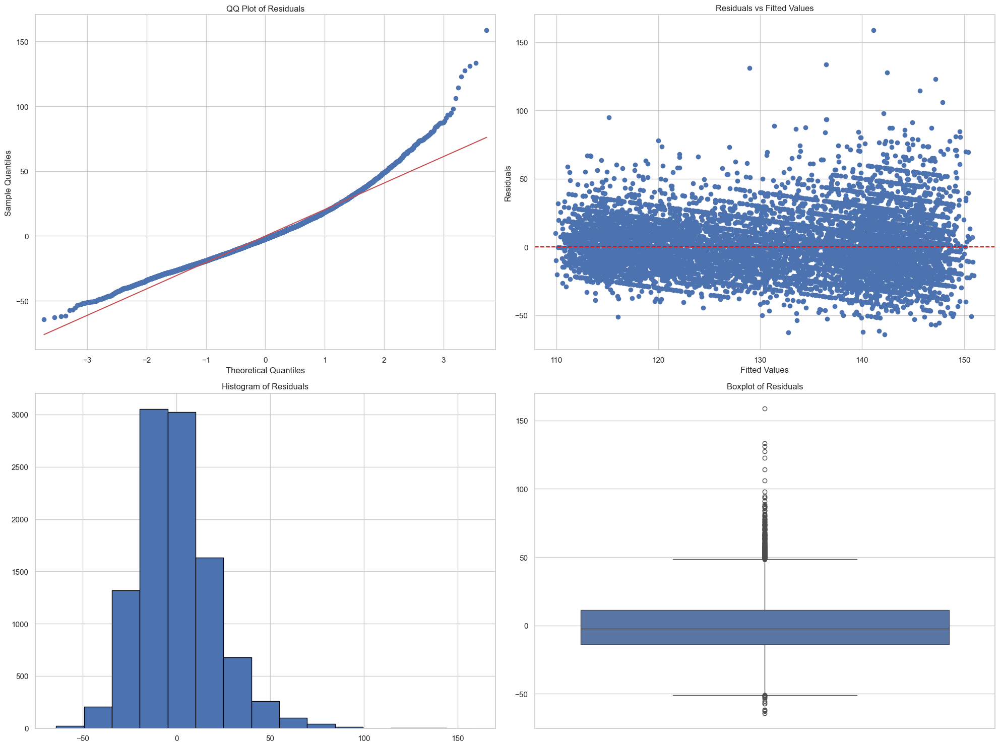

In [53]:
residuals = bpsystol_model.resid
fitted = bpsystol_model.fittedvalues

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sm.qqplot(residuals, line='s', ax=axs[0,0])
axs[0,0].set_title('QQ Plot of Residuals')

axs[0,1].scatter(fitted, residuals)
axs[0,1].axhline(y=0, color='red', linestyle='--')
axs[0,1].set_xlabel('Fitted Values')
axs[0,1].set_ylabel('Residuals')
axs[0,1].set_title('Residuals vs Fitted Values')

axs[1,0].hist(residuals, bins=15, edgecolor='black')
axs[1,0].set_title('Histogram of Residuals')

sns.boxplot(residuals, ax= axs[1,1])
axs[1,1].set_title('Boxplot of Residuals')

plt.tight_layout()
plt.show()

**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [54]:
influence_4 = oi.OLSInfluence(bpsystol_model).summary_frame()
influence_4

,dfb_Intercept,dfb_age,dfb_vitaminc,dfb_zinc,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,0.027046,-0.010737,0.023627,-0.033641,0.000483,-1.509598,0.000848,-0.043970,-1.509691,-0.043973
1,-0.002470,0.003906,-0.005069,0.002081,0.000029,-0.873989,0.000150,-0.010702,-0.873979,-0.010702
2,0.009813,0.009693,-0.006355,-0.012246,0.000086,-0.681574,0.000738,-0.018523,-0.681556,-0.018523
3,0.001759,0.015960,0.004011,-0.005289,0.000172,1.925351,0.000186,0.026258,1.925603,0.026262
4,0.018464,-0.010142,-0.007061,-0.016527,0.000127,-0.993609,0.000513,-0.022502,-0.993608,-0.022502
...,...,...,...,...,...,...,...,...,...,...
10344,-0.003172,0.009130,0.002175,-0.000710,0.000066,-1.318077,0.000151,-0.016211,-1.318124,-0.016212
10345,0.000159,-0.012534,0.008959,0.002262,0.000108,1.445952,0.000207,0.020799,1.446028,0.020800
10346,0.001417,-0.002023,0.000768,-0.001432,0.000003,-0.258941,0.000186,-0.003533,-0.258930,-0.003533
10347,-0.000618,0.007422,-0.000880,-0.001722,0.000028,-0.713046,0.000217,-0.010495,-0.713029,-0.010495


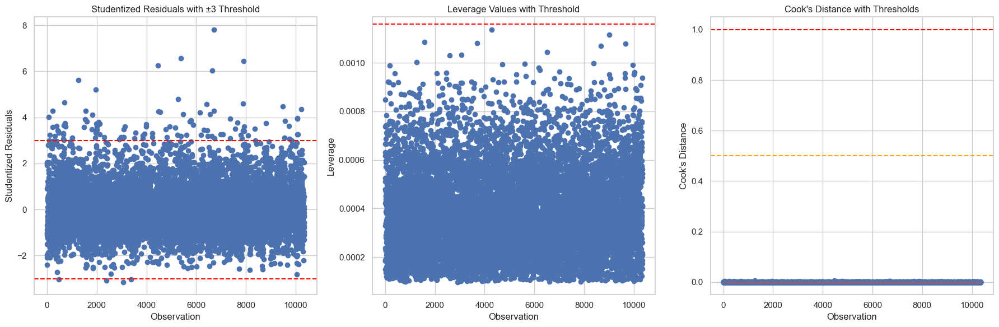

In [55]:
k = len(bpsystol_model.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_4["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_4["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_4["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [56]:
bpsystol_hetro = ssd.het_breuschpagan(bpsystol_model.resid,bpsystol_model.model.exog)
bpsystol_hetro_test_statistic, bpsystol_hetro_p_value = bpsystol_hetro[:2]
bpsystol_hetro_test_statistic, bpsystol_hetro_p_value

(np.float64(334.460542937001), np.float64(3.4531951261724116e-72))

### **weight**

In [57]:
waight =1/(bpsystol_model.resid**2)

In [58]:
w_bpsystol_model=smf.wls('np.log(bpsystol)~np.log(age)+np.log(vitaminc)+np.log(zinc)',data=nhanes,weights=waight).fit()

In [59]:
print(w_bpsystol_model.summary())

                            WLS Regression Results                            
Dep. Variable:       np.log(bpsystol)   R-squared:                       0.999
Model:                            WLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 4.882e+06
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:42:09   Log-Likelihood:                -5481.3
No. Observations:               10349   AIC:                         1.097e+04
Df Residuals:                   10345   BIC:                         1.100e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            4.2977      0.006  

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


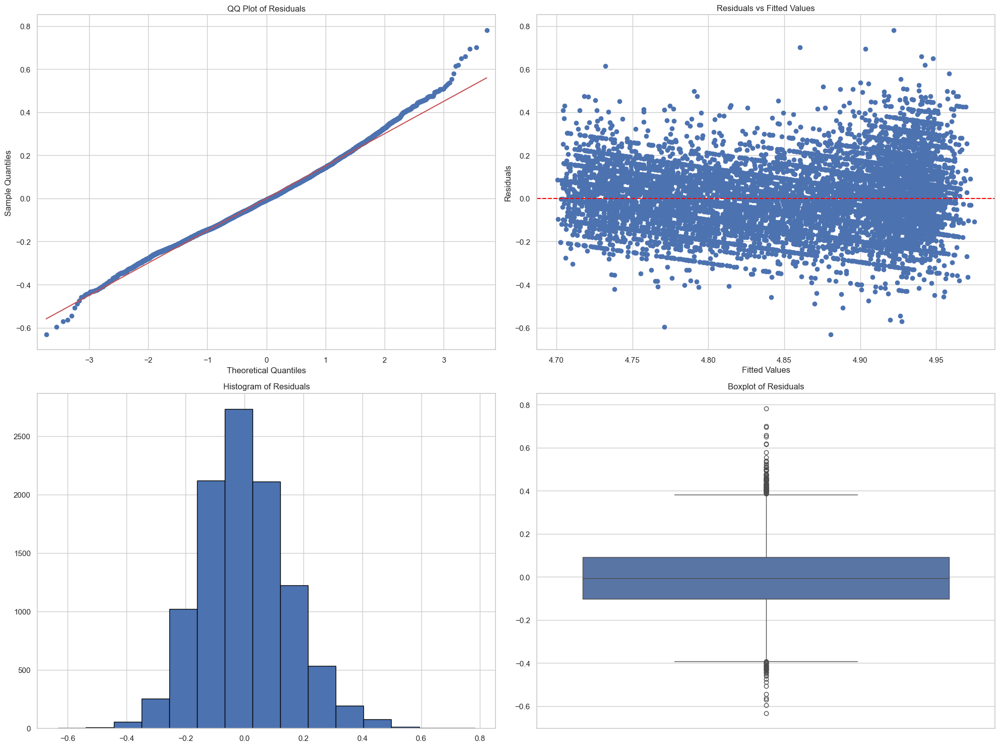

In [60]:
residuals = w_bpsystol_model.resid
fitted = w_bpsystol_model.fittedvalues

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sm.qqplot(residuals, line='s', ax=axs[0,0])
axs[0,0].set_title('QQ Plot of Residuals')

axs[0,1].scatter(fitted, residuals)
axs[0,1].axhline(y=0, color='red', linestyle='--')
axs[0,1].set_xlabel('Fitted Values')
axs[0,1].set_ylabel('Residuals')
axs[0,1].set_title('Residuals vs Fitted Values')

axs[1,0].hist(residuals, bins=15, edgecolor='black')
axs[1,0].set_title('Histogram of Residuals')

sns.boxplot(residuals, ax= axs[1,1])
axs[1,1].set_title('Boxplot of Residuals')

plt.tight_layout()
plt.show()

**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [61]:
influence_5 = oi.OLSInfluence(w_bpsystol_model).summary_frame()
influence_5

,dfb_Intercept,dfb_np.log(age),dfb_np.log(vitaminc),dfb_np.log(zinc),cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,7.225336,-14.488320,1.137714,-3.065438,3.230234e-05,-5.855254,3.768780e-06,-0.011367,-1.601901,-0.003110
1,7.088845,-14.443231,1.056563,-2.960745,5.162824e-06,-3.888474,1.365804e-06,-0.004544,-1.063738,-0.001243
2,7.131869,-14.413183,1.055594,-3.002732,8.701761e-06,-3.111063,3.596235e-06,-0.005900,-0.851047,-0.001614
3,7.104529,-14.411814,1.086088,-2.978457,1.977301e-05,6.611814,1.809217e-06,0.008893,1.808916,0.002433
4,7.153534,-14.475310,1.056786,-3.008142,3.022189e-06,-3.154349,1.214959e-06,-0.003477,-0.862899,-0.000951
...,...,...,...,...,...,...,...,...,...,...
10344,7.097440,-14.426057,1.069873,-2.971744,4.188338e-07,-6.148481,4.431656e-08,-0.001294,-1.682123,-0.000354
10345,7.095902,-14.479773,1.093000,-2.957418,7.312139e-07,5.119681,1.115883e-07,0.001710,1.400614,0.000468
10346,7.101179,-14.452781,1.071591,-2.968460,1.114835e-07,-0.390292,2.927455e-06,-0.000668,-0.106763,-0.000183
10347,7.099534,-14.426039,1.065625,-2.973044,6.574337e-07,-3.302493,2.411172e-07,-0.001622,-0.903419,-0.000444


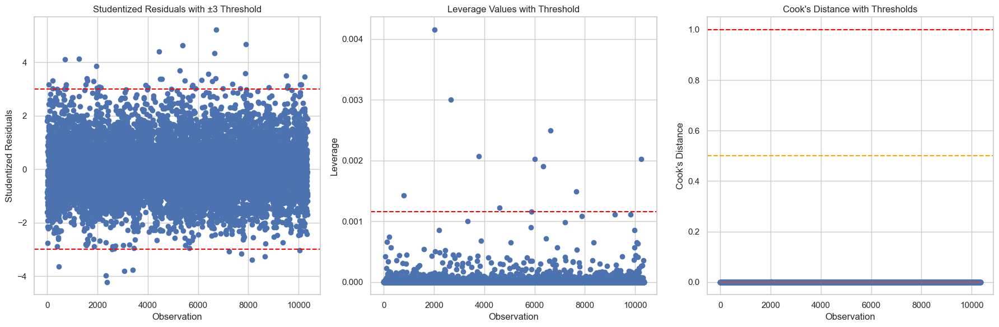

In [62]:
k = len(w_bpsystol_model.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_5["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_5["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_5["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [63]:
w_bpsystol_hetro = ssd.het_breuschpagan(w_bpsystol_model.resid,w_bpsystol_model.model.exog)
w_bpsystol_hetro_test_statistic, w_bpsystol_hetro_p_value = w_bpsystol_hetro[:2]
w_bpsystol_hetro_test_statistic, w_bpsystol_hetro_p_value

(np.float64(142.98594152041036), np.float64(8.582031792838184e-31))

## **hct_model**

In [64]:
hct_model = smf.ols('(tcresult)~weight+age+sex+hdresult',data=nhanes).fit()

In [65]:
print(hct_model.summary())

                            OLS Regression Results                            
Dep. Variable:               tcresult   R-squared:                       0.110
Model:                            OLS   Adj. R-squared:                  0.110
Method:                 Least Squares   F-statistic:                     319.8
Date:                Mon, 10 Mar 2025   Prob (F-statistic):          7.64e-260
Time:                        10:42:38   Log-Likelihood:                -48808.
No. Observations:               10349   AIC:                         9.763e+04
Df Residuals:                   10344   BIC:                         9.766e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    169.5813      3.178     53.353      0.0

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


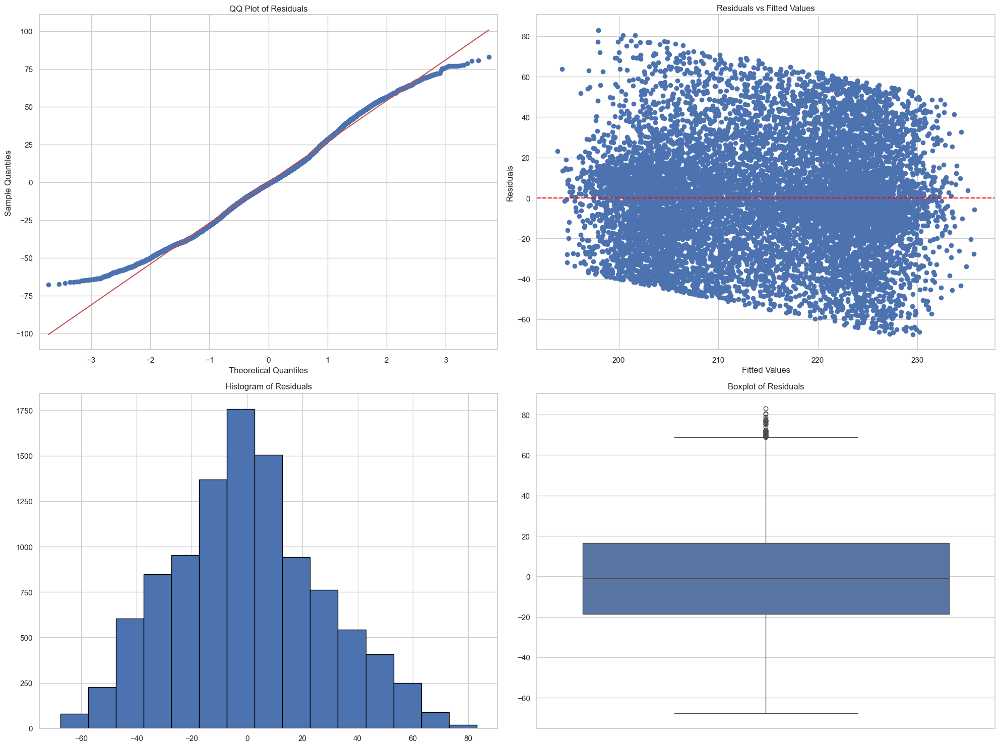

In [66]:
residuals = hct_model.resid
fitted = hct_model.fittedvalues

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sm.qqplot(residuals, line='s', ax=axs[0,0])
axs[0,0].set_title('QQ Plot of Residuals')

axs[0,1].scatter(fitted, residuals)
axs[0,1].axhline(y=0, color='red', linestyle='--')
axs[0,1].set_xlabel('Fitted Values')
axs[0,1].set_ylabel('Residuals')
axs[0,1].set_title('Residuals vs Fitted Values')

axs[1,0].hist(residuals, bins=15, edgecolor='black')
axs[1,0].set_title('Histogram of Residuals')

sns.boxplot(residuals, ax= axs[1,1])
axs[1,1].set_title('Boxplot of Residuals')

plt.tight_layout()
plt.show()

**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [67]:
influence_6 = oi.OLSInfluence(hct_model).summary_frame()
influence_6

,dfb_Intercept,dfb_weight,dfb_age,dfb_sex,dfb_hdresult,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,0.002357,-0.005561,0.001844,0.006660,0.001141,1.523537e-05,0.422253,0.000427,0.008728,0.422237,0.008728
1,-0.003247,0.008394,0.004472,0.004128,-0.008049,9.502283e-05,-1.223488,0.000317,-0.021797,-1.223518,-0.021798
2,-0.001930,0.002127,-0.008763,-0.003989,0.005665,3.247657e-05,0.557489,0.000522,0.012743,0.557471,0.012743
3,-0.011782,0.003444,-0.011721,0.013717,0.016736,1.402158e-04,-1.271461,0.000433,-0.026478,-1.271499,-0.026479
4,-0.000006,0.000010,0.000013,-0.000017,-0.000002,1.324434e-10,0.001411,0.000332,0.000026,0.001411,0.000026
...,...,...,...,...,...,...,...,...,...,...,...
10344,-0.007661,0.008644,0.005718,0.003046,-0.000684,5.066214e-05,-0.848642,0.000352,-0.015916,-0.848630,-0.015916
10345,0.007862,-0.001854,-0.004090,-0.005849,-0.007961,2.675914e-05,0.525604,0.000484,0.011567,0.525586,0.011567
10346,-0.008713,-0.000857,-0.006114,0.011474,0.015178,8.163877e-05,-0.819373,0.000608,-0.020204,-0.819360,-0.020203
10347,-0.005697,0.011657,0.011145,0.001098,-0.009535,1.285314e-04,-1.076778,0.000554,-0.025351,-1.076787,-0.025351


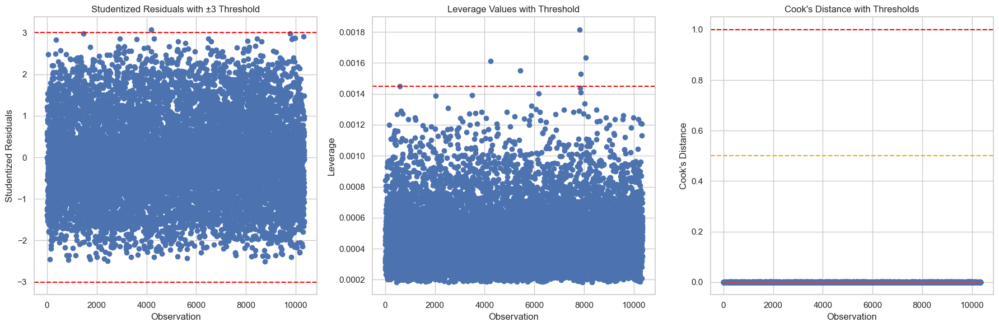

In [68]:
k = len(hct_model.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_6["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_6["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_6["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [69]:
hct_hetro = ssd.het_breuschpagan(hct_model.resid,hct_model.model.exog)
hct_hetro_test_statistic, hct_hetro_p_value = hct_hetro[:2]
hct_hetro_test_statistic, hct_hetro_p_value

(np.float64(42.69358138960429), np.float64(1.1979032859285963e-08))

### **transformation**

**transformation for y(dependant variable) beecase the four assumptions (normality, equal variance, dependency)** 

In [70]:
hct_model_t = smf.ols('np.log(tcresult)~weight+age+sex+hdresult',data=nhanes).fit()

In [71]:
print(hct_model_t.summary())

                            OLS Regression Results                            
Dep. Variable:       np.log(tcresult)   R-squared:                       0.111
Model:                            OLS   Adj. R-squared:                  0.111
Method:                 Least Squares   F-statistic:                     323.1
Date:                Mon, 10 Mar 2025   Prob (F-statistic):          1.99e-262
Time:                        10:43:08   Log-Likelihood:                 6748.9
No. Observations:               10349   AIC:                        -1.349e+04
Df Residuals:                   10344   BIC:                        -1.345e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.1491      0.015    347.510      0.0

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


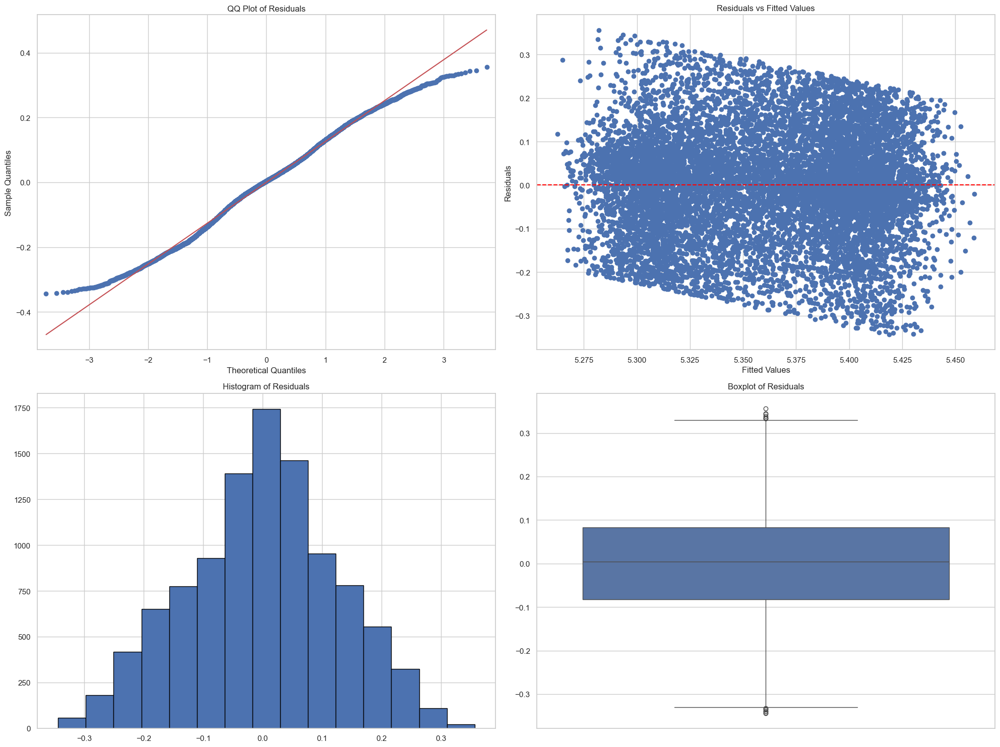

In [72]:
residuals = hct_model_t.resid
fitted = hct_model_t.fittedvalues

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sm.qqplot(residuals, line='s', ax=axs[0,0])
axs[0,0].set_title('QQ Plot of Residuals')

axs[0,1].scatter(fitted, residuals)
axs[0,1].axhline(y=0, color='red', linestyle='--')
axs[0,1].set_xlabel('Fitted Values')
axs[0,1].set_ylabel('Residuals')
axs[0,1].set_title('Residuals vs Fitted Values')

axs[1,0].hist(residuals, bins=15, edgecolor='black')
axs[1,0].set_title('Histogram of Residuals')

sns.boxplot(residuals, ax= axs[1,1])
axs[1,1].set_title('Boxplot of Residuals')

plt.tight_layout()
plt.show()

**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [73]:
influence_7 = oi.OLSInfluence(hct_model_t).summary_frame()
influence_7

,dfb_Intercept,dfb_weight,dfb_age,dfb_sex,dfb_hdresult,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,0.002694,-0.006355,0.002107,0.007612,0.001304,1.989756e-05,0.482555,0.000427,0.009974,0.482537,0.009974
1,-0.003372,0.008719,0.004646,0.004288,-0.008360,1.025199e-04,-1.270837,0.000317,-0.022641,-1.270875,-0.022641
2,-0.002188,0.002412,-0.009936,-0.004522,0.006423,4.175154e-05,0.632103,0.000522,0.014448,0.632084,0.014448
3,-0.011714,0.003424,-0.011653,0.013637,0.016639,1.385895e-04,-1.264066,0.000433,-0.026324,-1.264102,-0.026325
4,-0.000239,0.000417,0.000520,-0.000685,-0.000085,2.249150e-07,0.058158,0.000332,0.001060,0.058156,0.001060
...,...,...,...,...,...,...,...,...,...,...,...
10344,-0.007728,0.008719,0.005768,0.003073,-0.000690,5.155278e-05,-0.856069,0.000352,-0.016055,-0.856058,-0.016055
10345,0.008874,-0.002093,-0.004616,-0.006602,-0.008986,3.408842e-05,0.593234,0.000484,0.013055,0.593215,0.013055
10346,-0.008201,-0.000807,-0.005755,0.010800,0.014286,7.233224e-05,-0.771257,0.000608,-0.019017,-0.771242,-0.019017
10347,-0.006057,0.012394,0.011849,0.001168,-0.010137,1.452855e-04,-1.144809,0.000554,-0.026952,-1.144826,-0.026953


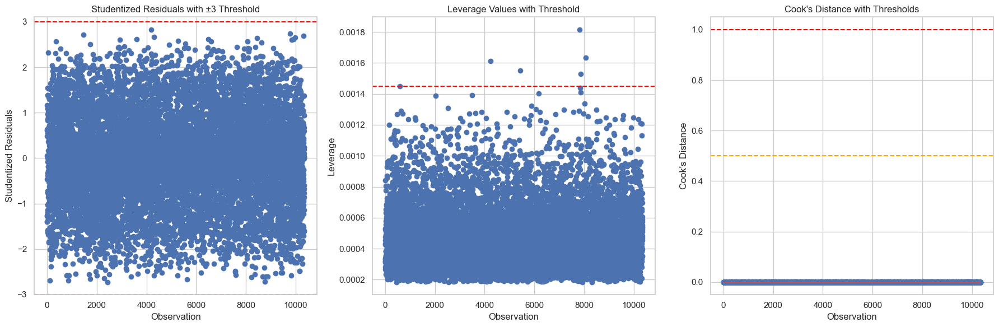

In [74]:
k = len(hct_model_t.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_7["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_7["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_7["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [75]:
hct_hetro_t = ssd.het_breuschpagan(hct_model_t.resid,hct_model_t.model.exog)
hct_hetro_t_test_statistic, hct_hetro_t_p_value = hct_hetro_t[:2]
print(hct_hetro_t_test_statistic, hct_hetro_t_p_value)

13.529569280955648 0.008958200413213506


## **weight**

In [76]:
weight =1/(bpsystol_model.resid**2)

In [77]:
w_hct_model=smf.wls('(tcresult)~weight+age+sex+hdresult',data=nhanes,weights=waight).fit()

In [78]:
w_hct_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:               tcresult   R-squared:                       0.943
Model:                            WLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                 4.260e+04
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:43:39   Log-Likelihood:                -82831.
No. Observations:               10349   AIC:                         1.657e+05
Df Residuals:                   10344   BIC:                         1.657e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    106.0550      4.227     25.089      0.000      97.769     114.341
weight        -0.5936      0.030    -19.540      0.000      -0.653      -0.534
age           -0.3506      0.006    -58.604      0.000      -0.362      -0.339
sex            7.3367      0.198     36.978      0.000       6.948       7.726
hdresult       3.3772      0.049     69.353      0.000       3.282       3.473
==============================================================================
Omnibus:                    24853.230   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):       2004389488.726
Skew:                         -23.717   Prob(JB):                         0.00
Kurtosis:                    2158.472   Cond. No.                     2.07e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.07e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


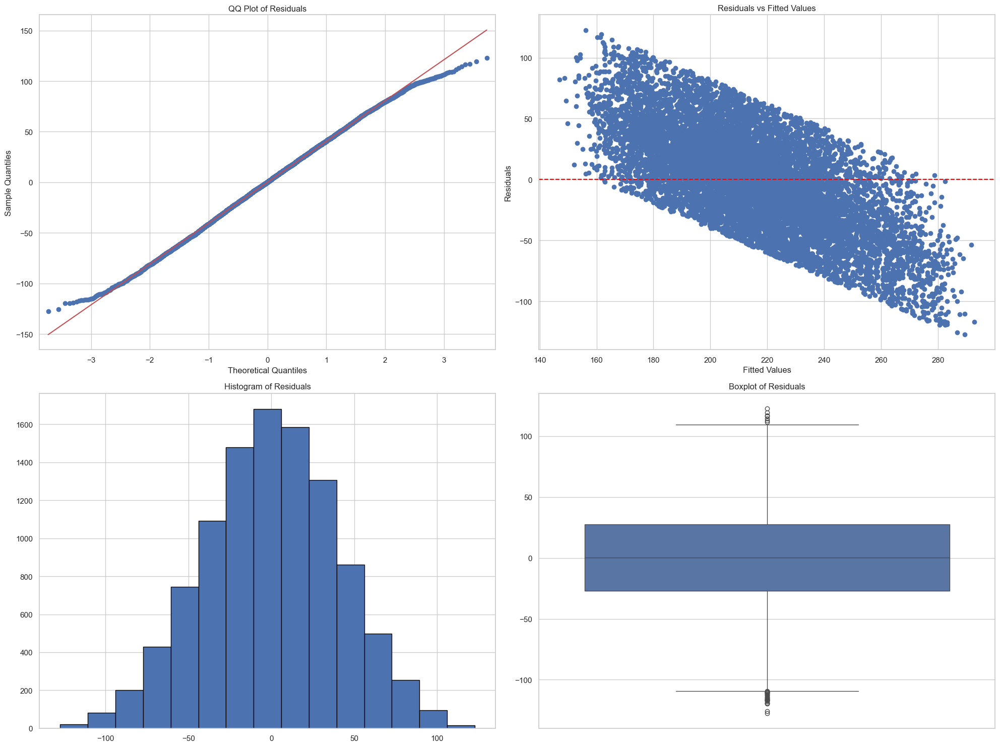

In [79]:
residuals = w_hct_model.resid
fitted = w_hct_model.fittedvalues

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sm.qqplot(residuals, line='s', ax=axs[0,0])
axs[0,0].set_title('QQ Plot of Residuals')

axs[0,1].scatter(fitted, residuals)
axs[0,1].axhline(y=0, color='red', linestyle='--')
axs[0,1].set_xlabel('Fitted Values')
axs[0,1].set_ylabel('Residuals')
axs[0,1].set_title('Residuals vs Fitted Values')

axs[1,0].hist(residuals, bins=15, edgecolor='black')
axs[1,0].set_title('Histogram of Residuals')

sns.boxplot(residuals, ax= axs[1,1])
axs[1,1].set_title('Boxplot of Residuals')

plt.tight_layout()
plt.show()

**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [80]:
influence_8 = oi.OLSInfluence(w_hct_model).summary_frame()
influence_8

,dfb_Intercept,dfb_weight,dfb_age,dfb_sex,dfb_hdresult,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,-40.137434,-71.321982,-390.637967,156.950927,177.218610,1.632870e-10,-0.034774,6.751838e-07,-0.000029,-0.092887,-0.000076
1,-40.151249,-71.289786,-390.644700,156.940406,177.210378,4.042442e-07,-0.964540,2.172564e-06,-0.001422,-2.576627,-0.003798
2,-40.146303,-71.302198,-390.713778,156.865626,177.229361,1.701509e-07,-0.465100,3.932872e-06,-0.000922,-1.242375,-0.002464
3,-40.168626,-71.303232,-390.758887,157.019028,177.264076,2.036284e-10,0.060652,2.767689e-07,0.000032,0.162024,0.000085
4,-40.141835,-71.306699,-390.647256,156.895460,177.214655,3.324171e-08,0.315724,1.667388e-06,0.000408,0.843350,0.001089
...,...,...,...,...,...,...,...,...,...,...,...
10344,-40.158608,-71.286452,-390.621424,156.925743,177.219374,9.720124e-08,-0.751875,8.597060e-07,-0.000697,-2.008449,-0.001862
10345,-40.126567,-71.312560,-390.680826,156.850285,177.200106,3.305969e-08,0.431338,8.884518e-07,0.000407,1.152187,0.001086
10346,-40.160626,-71.311297,-390.702279,156.993680,177.252665,1.083228e-07,0.455123,2.614759e-06,0.000736,1.215745,0.001966
10347,-40.155516,-71.280032,-390.592207,156.913290,177.204329,8.472110e-07,-1.207476,2.905384e-06,-0.002058,-3.225542,-0.005498


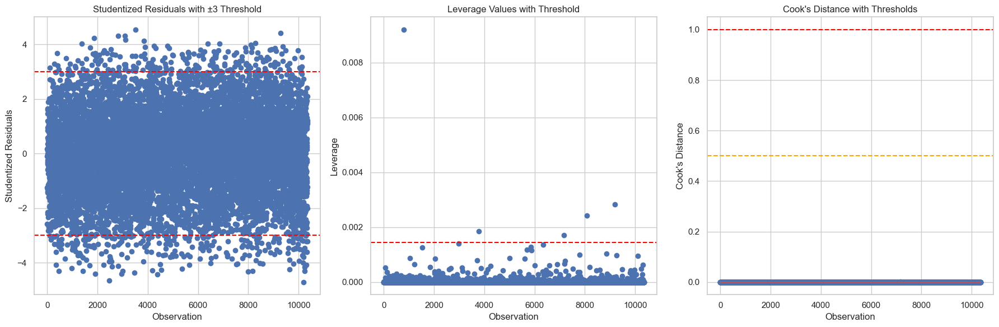

In [81]:
k = len(w_hct_model.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_8["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_8["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_8["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [82]:
w_hct_hetro = ssd.het_breuschpagan(w_hct_model.resid,w_hct_model.model.exog)
w_hct_hetro_test_statistic, w_hct_hetro_p_value = w_hct_hetro[:2]
w_hct_hetro_test_statistic, w_hct_hetro_p_value

(np.float64(156.28101529395866), np.float64(9.170806867446944e-33))

### **wtransformation**

**transformation for y(dependant variable)  beecase the four assumptions (normality, equal variance, dependency)** 

In [83]:
w_hct_model_t=smf.wls('np.log(tcresult)~weight+age+sex+hdresult',data=nhanes,weights=waight).fit()

In [84]:
print(w_hct_model_t.summary())

                            WLS Regression Results                            
Dep. Variable:       np.log(tcresult)   R-squared:                       0.947
Model:                            WLS   Adj. R-squared:                  0.947
Method:                 Least Squares   F-statistic:                 4.655e+04
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:44:11   Log-Likelihood:                -27779.
No. Observations:               10349   AIC:                         5.557e+04
Df Residuals:                   10344   BIC:                         5.560e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.0225      0.021    242.731      0.0

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we reject H0


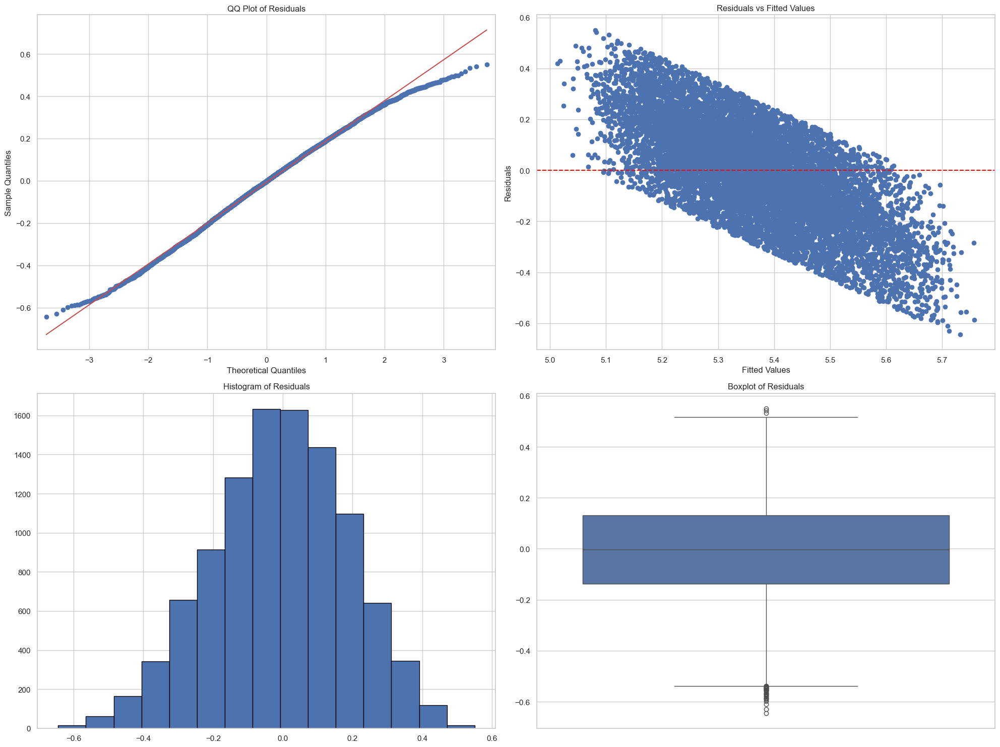

In [85]:
residuals = w_hct_model_t.resid
fitted = w_hct_model_t.fittedvalues

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sm.qqplot(residuals, line='s', ax=axs[0,0])
axs[0,0].set_title('QQ Plot of Residuals')

axs[0,1].scatter(fitted, residuals)
axs[0,1].axhline(y=0, color='red', linestyle='--')
axs[0,1].set_xlabel('Fitted Values')
axs[0,1].set_ylabel('Residuals')
axs[0,1].set_title('Residuals vs Fitted Values')

axs[1,0].hist(residuals, bins=15, edgecolor='black')
axs[1,0].set_title('Histogram of Residuals')

sns.boxplot(residuals, ax= axs[1,1])
axs[1,1].set_title('Boxplot of Residuals')

plt.tight_layout()
plt.show()

**check the four assumptions (normality, leniarty, equal variance, dependency)**

In [86]:
influence_9 = oi.OLSInfluence(w_hct_model_t).summary_frame()
influence_9

,dfb_Intercept,dfb_weight,dfb_age,dfb_sex,dfb_hdresult,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,-17.158012,-108.106234,-400.059818,202.240674,170.690229,1.250661e-09,-0.096237,6.751838e-07,-0.000079,-0.269924,-0.000222
1,-17.171344,-108.073769,-400.069005,202.227247,170.681097,4.279250e-07,-0.992389,2.172564e-06,-0.001463,-2.783609,-0.004103
2,-17.167957,-108.084024,-400.146277,202.143962,170.702485,1.448400e-07,-0.429115,3.932872e-06,-0.000851,-1.203578,-0.002387
3,-17.188084,-108.087621,-400.181324,202.302851,170.734082,7.164110e-11,0.035976,2.767689e-07,0.000019,0.100910,0.000053
4,-17.163713,-108.087206,-400.066351,202.171187,170.685385,3.974351e-08,0.345223,1.667388e-06,0.000446,0.968259,0.001250
...,...,...,...,...,...,...,...,...,...,...,...
10344,-17.179360,-108.069159,-400.044186,202.208774,170.690117,1.085013e-07,-0.794378,8.597060e-07,-0.000737,-2.228101,-0.002066
10345,-17.145698,-108.095634,-400.108587,202.126644,170.669345,2.747032e-08,0.393188,8.884518e-07,0.000371,1.102806,0.001039
10346,-17.180196,-108.093518,-400.121158,202.270055,170.720806,1.031553e-07,0.444134,2.614759e-06,0.000718,1.245716,0.002014
10347,-17.176483,-108.062504,-400.013325,202.198983,170.674809,9.174439e-07,-1.256529,2.905384e-06,-0.002142,-3.524455,-0.006008


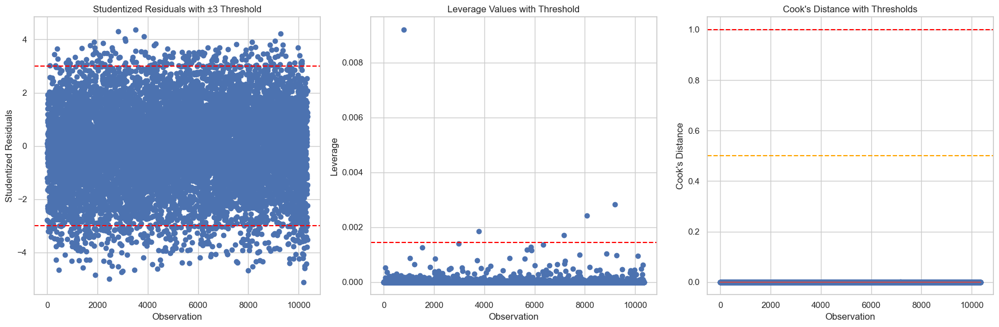

In [87]:
k = len(w_hct_model_t.params) - 1  # subtracting 1 for the intercept
n = len(num_nhanes)

# Thresholds
leverage_threshold = 3 * (k + 1) / n
cooks_d_threshold1 = 0.5  # Somewhat influential
cooks_d_threshold2 = 1    # Excessively influential

# Create subplots for each criterion
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Studentized Residuals Plot
axs[0].scatter(range(n), influence_9["student_resid"])
axs[0].axhline(y=3, color='red', linestyle='--')
axs[0].axhline(y=-3, color='red', linestyle='--')
axs[0].set_xlabel('Observation')
axs[0].set_ylabel('Studentized Residuals')
axs[0].set_title('Studentized Residuals with ±3 Threshold')

# Leverage Plot
axs[1].scatter(range(n), influence_9["hat_diag"])
axs[1].axhline(y=leverage_threshold, color='red', linestyle='--')
axs[1].set_xlabel('Observation')
axs[1].set_ylabel('Leverage')
axs[1].set_title('Leverage Values with Threshold')

# Cook's Distance Plot
axs[2].stem(influence_9["cooks_d"])
axs[2].axhline(y=cooks_d_threshold1, color='orange', linestyle='--')
axs[2].axhline(y=cooks_d_threshold2, color='red', linestyle='--')
axs[2].set_xlabel('Observation')
axs[2].set_ylabel("Cook's Distance")
axs[2].set_title("Cook's Distance with Thresholds")

plt.tight_layout()
plt.show()

Null Hypothesis (H0): Homoscedasticity is present (the residuals are distributed with equal variance)
 
Alternative Hypothesis (HA): Heteroscedasticity is present (the residuals are not distributed with equal variance)

reject H0

In [88]:
w_hct_hetro_t = ssd.het_breuschpagan(w_hct_model_t.resid,w_hct_model_t.model.exog)
w_hct_hetro_t_test_statistic, w_hct_hetro_t_p_value = w_hct_hetro_t[:2]
w_hct_hetro_t_test_statistic, w_hct_hetro_t_p_value

(np.float64(282.9719062858086), np.float64(5.095693937737758e-60))

## **diabetes_logistic_model**

In [89]:
diabetes_model = smf.logit('(heartatk)~age+sex+weight',data=nhanes).fit()

Optimization terminated successfully.
         Current function value: 0.157190
         Iterations 9


In [90]:
print(diabetes_model.summary())

                           Logit Regression Results                           
Dep. Variable:               heartatk   No. Observations:                10349
Model:                          Logit   Df Residuals:                    10345
Method:                           MLE   Df Model:                            3
Date:                Mon, 10 Mar 2025   Pseudo R-squ.:                  0.1574
Time:                        10:44:43   Log-Likelihood:                -1626.8
converged:                       True   LL-Null:                       -1930.6
Covariance Type:            nonrobust   LLR p-value:                2.189e-131
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -8.5201      0.495    -17.200      0.000      -9.491      -7.549
age            0.0857      0.005     17.508      0.000       0.076       0.095
sex            0.8990      0.110      8.207      0.0

H0: The model is a good-fitting model.

H1: The model is not a good-fitting model.

in this model we reject all H0 except accept weight  


## **ANOVA**

In [91]:
tcresult_model = smf.ols('(bmi)~hlthstat',data=nhanes).fit()
print(tcresult_model.summary())

                            OLS Regression Results                            
Dep. Variable:                    bmi   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     31.69
Date:                Mon, 10 Mar 2025   Prob (F-statistic):           3.74e-32
Time:                        10:44:43   Log-Likelihood:                -26459.
No. Observations:               10349   AIC:                         5.293e+04
Df Residuals:                   10343   BIC:                         5.297e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                24.06

H0: The model is a good-fitting model.

H1: The model is not a good-fitting model.

in this model we accept H0 


In [92]:
av.anova_lm(tcresult_model)

,df,sum_sq,mean_sq,F,PR(>F)
hlthstat,5.0,1543.076729,308.615346,31.693774,3.741562e-32
Residual,10343.0,100714.055131,9.737412,NaN,NaN


H0:all mean are equal

H1:at least two population means are different

reject H0

In [93]:
tcresult_model_a = smf.ols('(bmi)~hlthstat+weight',data=nhanes).fit()
print(tcresult_model_a.summary())


                            OLS Regression Results                            
Dep. Variable:                    bmi   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.550
Method:                 Least Squares   F-statistic:                     2105.
Date:                Mon, 10 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:44:43   Log-Likelihood:                -22407.
No. Observations:               10349   AIC:                         4.483e+04
Df Residuals:                   10342   BIC:                         4.488e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 8.84

H0 : (no linear relationship between depnedant variabels and indepnedant)

H1 : (linear relationship between depnedant variabels and indepnedant)

in this model we accept H0 except weight rject H0


In [94]:
av.anova_lm(tcresult_model_a)

,df,sum_sq,mean_sq,F,PR(>F)
hlthstat,5.0,1543.076729,308.615346,69.337663,1.475909e-71
weight,1.0,54682.796239,54682.796239,12285.770416,0.000000e+00
Residual,10342.0,46031.258892,4.450905,NaN,NaN


H0:all mean are equal

H1:at least two population means are different

reject H0 We reject the hypothesis that the mean percent of  is the same for all
four groups.